# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

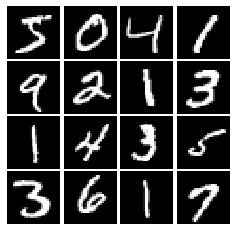

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha*x,x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size,dim],-1,1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [11]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256,input_shape=(784,)),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [12]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [23]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024,input_shape=(noise_dim,),activation=tf.nn.relu),
        tf.keras.layers.Dense(1024,activation=tf.nn.relu),
        tf.keras.layers.Dense(784,activation=tf.nn.tanh)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [24]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [25]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits = True)
    ones = tf.ones_like(logits_real)
    zeros = tf.zeros_like(logits_fake)
    loss = bce(ones, logits_real) + bce(zeros, logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits = True)
    ones = tf.ones_like(logits_fake)
    loss = bce(ones, logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [26]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

W0819 10:52:07.478797 12220 deprecation.py:323] From D:\Program Files\Anaconda3\envs\tf20\lib\site-packages\tensorflow\python\ops\nn_impl.py:182: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Maximum error in d_loss: 3.97058e-09


In [27]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [29]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate, beta1)
    G_solver = tf.optimizers.Adam(learning_rate, beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [30]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.26, G:0.6905


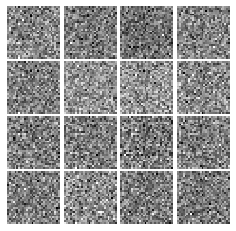

Epoch: 0, Iter: 20, D: 0.6155, G:0.8764


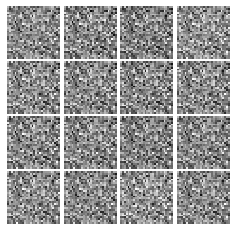

Epoch: 0, Iter: 40, D: 0.5606, G:1.009


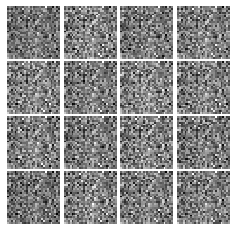

Epoch: 0, Iter: 60, D: 0.2731, G:1.754


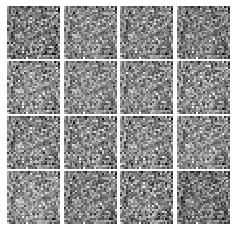

Epoch: 0, Iter: 80, D: 2.337, G:0.4634


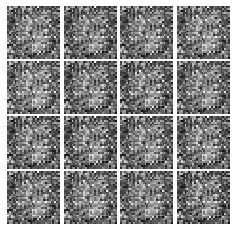

Epoch: 0, Iter: 100, D: 0.6338, G:1.687


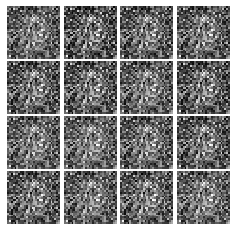

Epoch: 0, Iter: 120, D: 2.378, G:0.7309


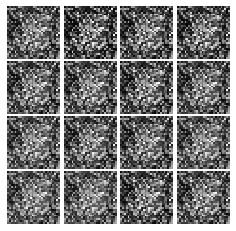

Epoch: 0, Iter: 140, D: 0.7292, G:2.625


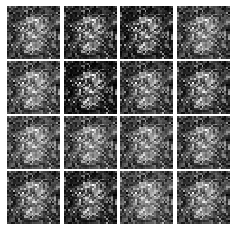

Epoch: 0, Iter: 160, D: 1.43, G:0.9479


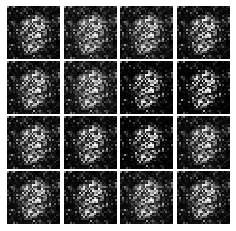

Epoch: 0, Iter: 180, D: 1.561, G:1.626


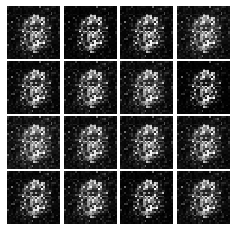

Epoch: 0, Iter: 200, D: 1.524, G:2.529


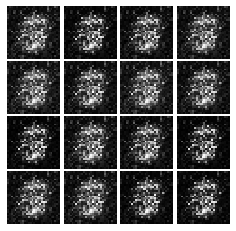

Epoch: 0, Iter: 220, D: 1.297, G:0.9925


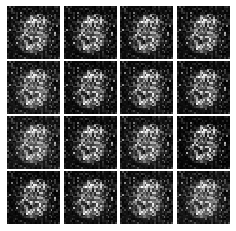

Epoch: 0, Iter: 240, D: 0.9509, G:1.435


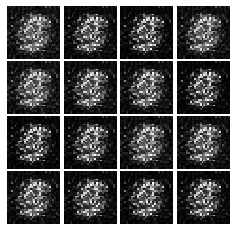

Epoch: 0, Iter: 260, D: 1.102, G:1.552


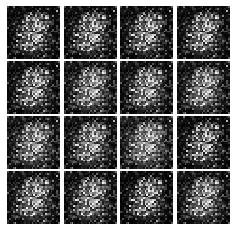

Epoch: 0, Iter: 280, D: 1.618, G:0.9551


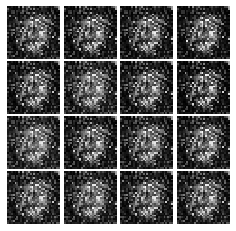

Epoch: 0, Iter: 300, D: 0.7279, G:1.967


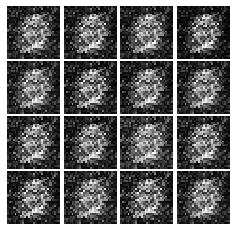

Epoch: 0, Iter: 320, D: 1.235, G:1.902


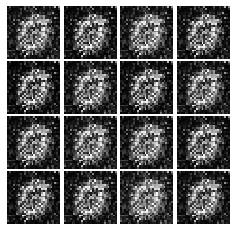

Epoch: 0, Iter: 340, D: 1.049, G:1.794


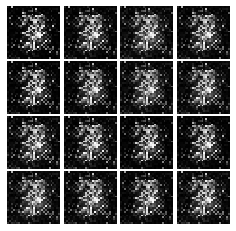

Epoch: 0, Iter: 360, D: 1.745, G:0.9272


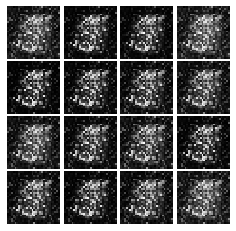

Epoch: 0, Iter: 380, D: 1.786, G:0.6719


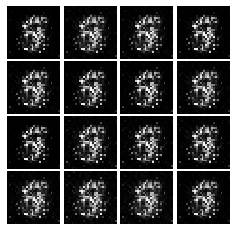

Epoch: 0, Iter: 400, D: 1.08, G:1.359


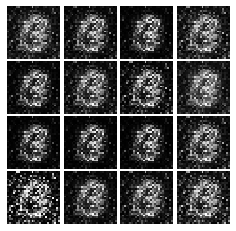

Epoch: 0, Iter: 420, D: 1.495, G:1.379


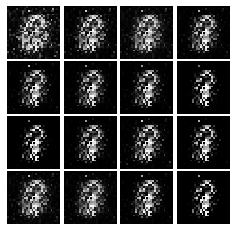

Epoch: 0, Iter: 440, D: 1.23, G:0.9228


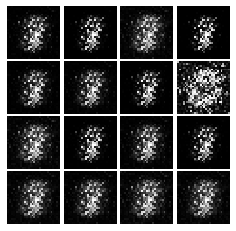

Epoch: 0, Iter: 460, D: 1.119, G:1.414


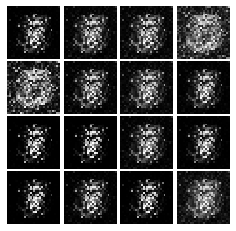

Epoch: 1, Iter: 480, D: 1.626, G:0.7522


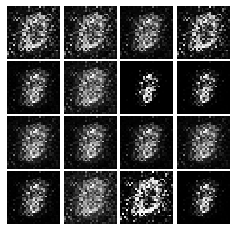

Epoch: 1, Iter: 500, D: 1.288, G:1.043


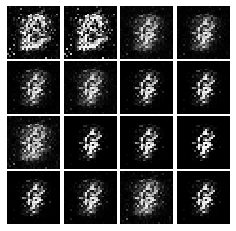

Epoch: 1, Iter: 520, D: 1.291, G:1.183


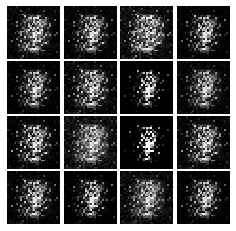

Epoch: 1, Iter: 540, D: 1.042, G:1.355


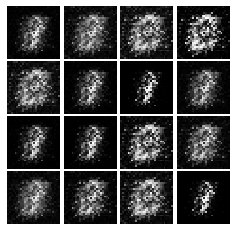

Epoch: 1, Iter: 560, D: 0.8003, G:1.448


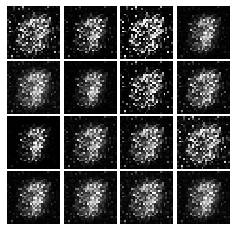

Epoch: 1, Iter: 580, D: 1.238, G:0.9928


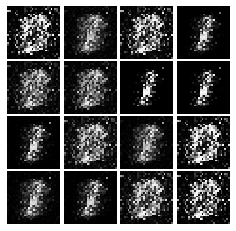

Epoch: 1, Iter: 600, D: 1.188, G:1.319


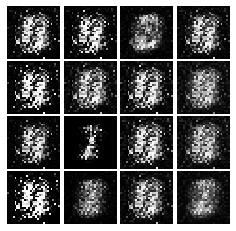

Epoch: 1, Iter: 620, D: 1.204, G:0.8401


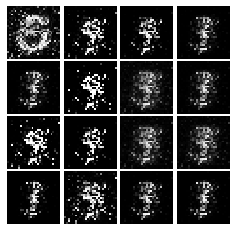

Epoch: 1, Iter: 640, D: 1.004, G:1.199


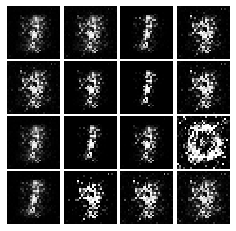

Epoch: 1, Iter: 660, D: 1.162, G:1.006


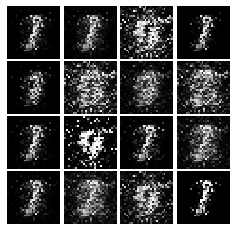

Epoch: 1, Iter: 680, D: 1.042, G:1.207


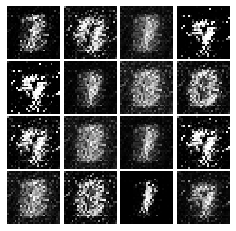

Epoch: 1, Iter: 700, D: 1.333, G:0.7725


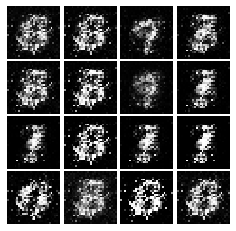

Epoch: 1, Iter: 720, D: 1.012, G:1.277


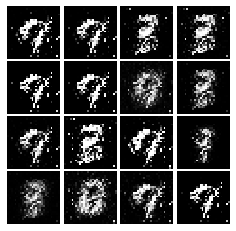

Epoch: 1, Iter: 740, D: 1.156, G:1.315


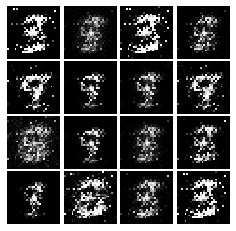

Epoch: 1, Iter: 760, D: 1.315, G:1.044


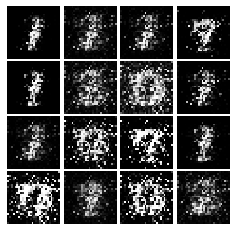

Epoch: 1, Iter: 780, D: 1.071, G:1.79


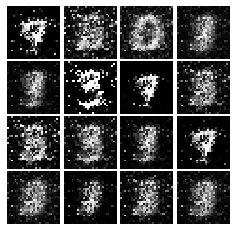

Epoch: 1, Iter: 800, D: 1.109, G:1.572


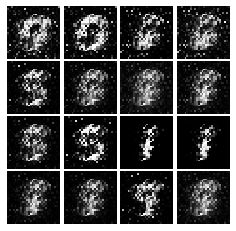

Epoch: 1, Iter: 820, D: 1.126, G:2.078


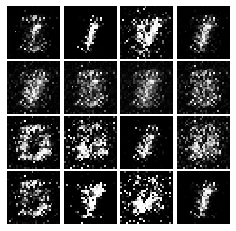

Epoch: 1, Iter: 840, D: 1.091, G:1.463


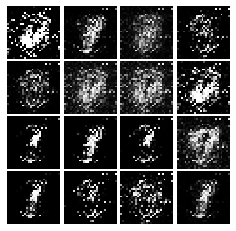

Epoch: 1, Iter: 860, D: 1.172, G:1.696


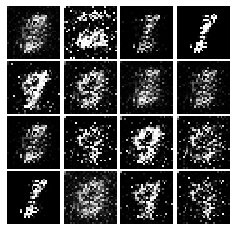

Epoch: 1, Iter: 880, D: 1.722, G:0.1683


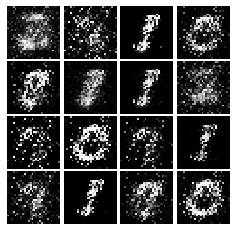

Epoch: 1, Iter: 900, D: 1.236, G:1.248


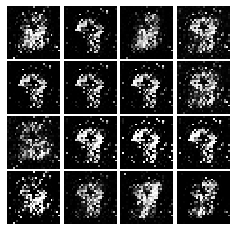

Epoch: 1, Iter: 920, D: 1.288, G:0.9494


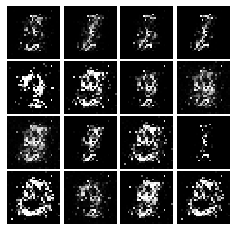

Epoch: 2, Iter: 940, D: 1.444, G:1.104


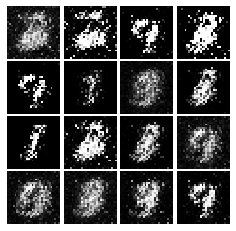

Epoch: 2, Iter: 960, D: 1.1, G:1.223


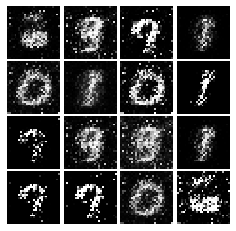

Epoch: 2, Iter: 980, D: 1.181, G:1.769


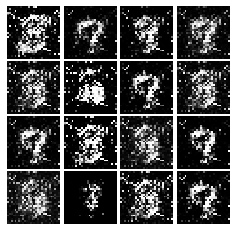

Epoch: 2, Iter: 1000, D: 1.013, G:1.457


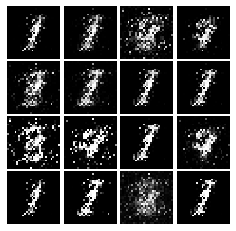

Epoch: 2, Iter: 1020, D: 1.257, G:1.164


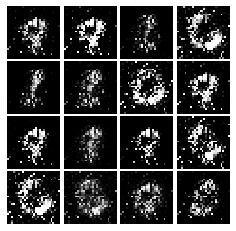

Epoch: 2, Iter: 1040, D: 1.157, G:1.492


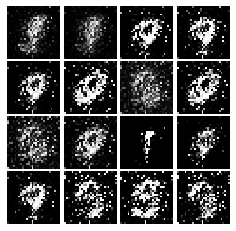

Epoch: 2, Iter: 1060, D: 1.609, G:0.9235


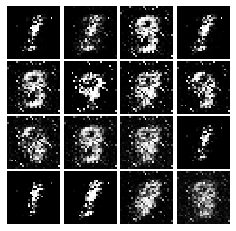

Epoch: 2, Iter: 1080, D: 1.404, G:1.031


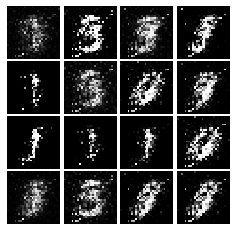

Epoch: 2, Iter: 1100, D: 1.149, G:1.273


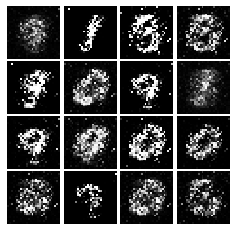

Epoch: 2, Iter: 1120, D: 1.075, G:1.281


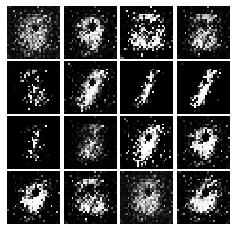

Epoch: 2, Iter: 1140, D: 1.387, G:1.09


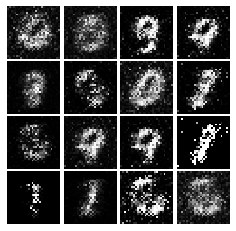

Epoch: 2, Iter: 1160, D: 1.246, G:1.018


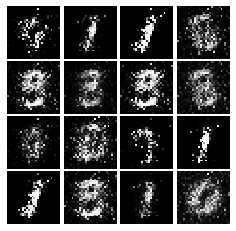

Epoch: 2, Iter: 1180, D: 1.274, G:0.8915


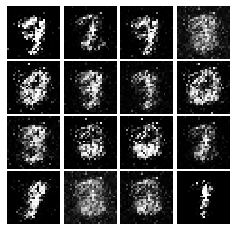

Epoch: 2, Iter: 1200, D: 1.336, G:1.007


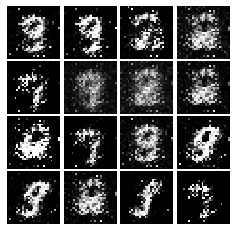

Epoch: 2, Iter: 1220, D: 1.21, G:0.9709


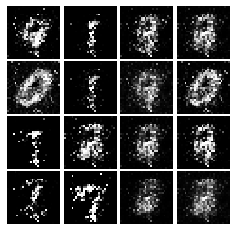

Epoch: 2, Iter: 1240, D: 1.222, G:0.8703


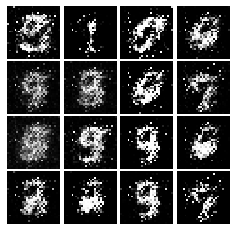

Epoch: 2, Iter: 1260, D: 1.195, G:0.9401


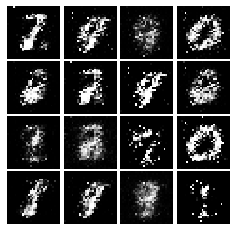

Epoch: 2, Iter: 1280, D: 1.324, G:0.5776


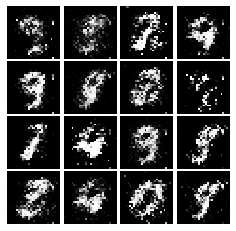

Epoch: 2, Iter: 1300, D: 1.317, G:0.7599


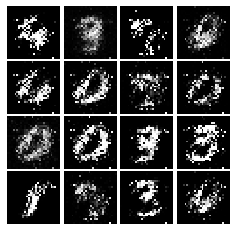

Epoch: 2, Iter: 1320, D: 1.398, G:1.026


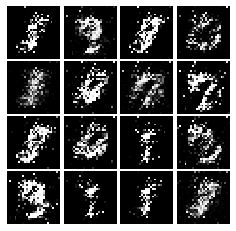

Epoch: 2, Iter: 1340, D: 1.811, G:1.062


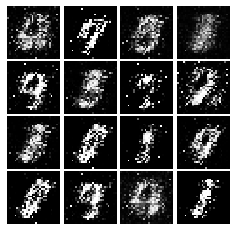

Epoch: 2, Iter: 1360, D: 1.283, G:1.325


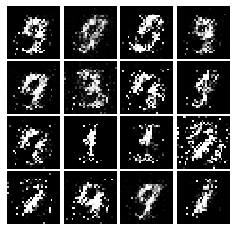

Epoch: 2, Iter: 1380, D: 1.255, G:1.006


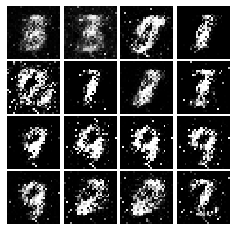

Epoch: 2, Iter: 1400, D: 1.375, G:1.06


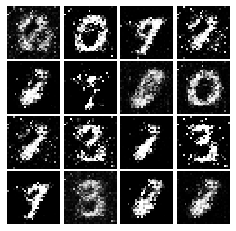

Epoch: 3, Iter: 1420, D: 1.352, G:0.8516


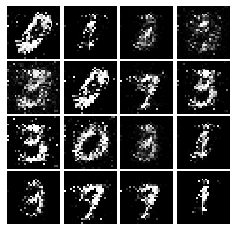

Epoch: 3, Iter: 1440, D: 1.206, G:0.9039


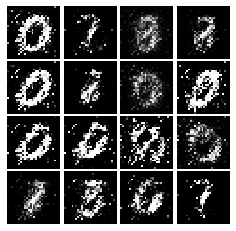

Epoch: 3, Iter: 1460, D: 1.192, G:0.9925


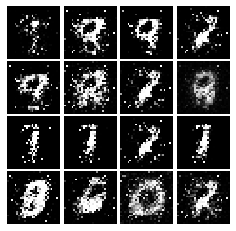

Epoch: 3, Iter: 1480, D: 1.46, G:2.14


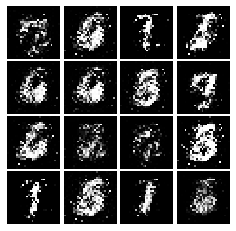

Epoch: 3, Iter: 1500, D: 1.213, G:1.318


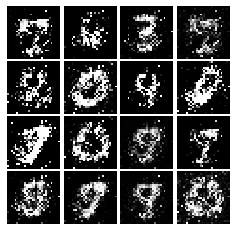

Epoch: 3, Iter: 1520, D: 1.054, G:1.849


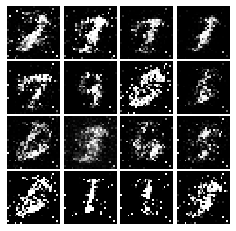

Epoch: 3, Iter: 1540, D: 1.276, G:0.9019


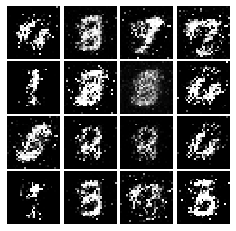

Epoch: 3, Iter: 1560, D: 1.286, G:0.9325


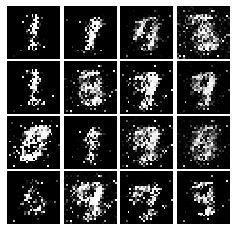

Epoch: 3, Iter: 1580, D: 1.212, G:0.9659


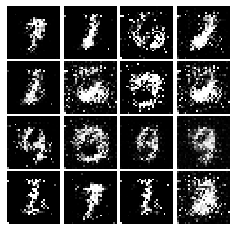

Epoch: 3, Iter: 1600, D: 1.345, G:1.534


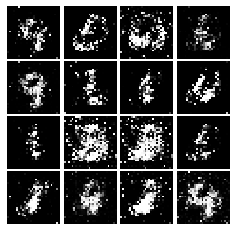

Epoch: 3, Iter: 1620, D: 1.204, G:1.419


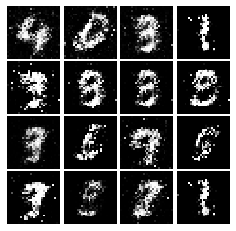

Epoch: 3, Iter: 1640, D: 1.192, G:1.126


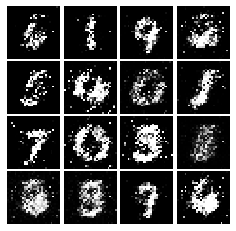

Epoch: 3, Iter: 1660, D: 1.204, G:1.531


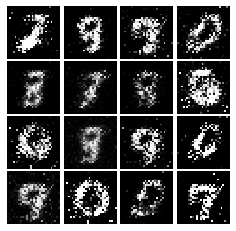

Epoch: 3, Iter: 1680, D: 1.219, G:1.034


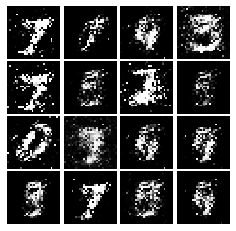

Epoch: 3, Iter: 1700, D: 1.283, G:1.07


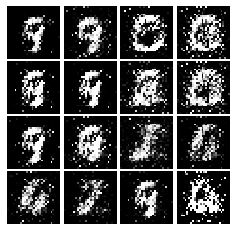

Epoch: 3, Iter: 1720, D: 1.195, G:0.9325


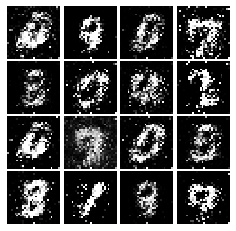

Epoch: 3, Iter: 1740, D: 1.164, G:1.162


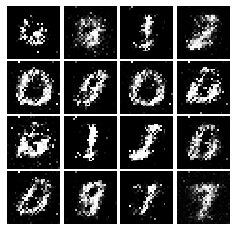

Epoch: 3, Iter: 1760, D: 1.252, G:1.101


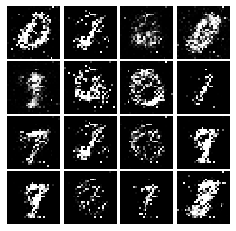

Epoch: 3, Iter: 1780, D: 1.167, G:1.384


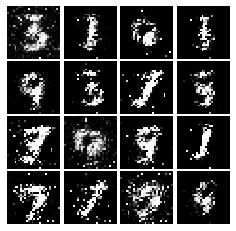

Epoch: 3, Iter: 1800, D: 1.298, G:1.12


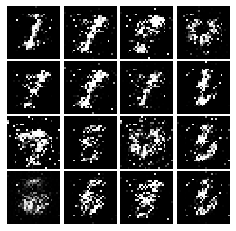

Epoch: 3, Iter: 1820, D: 0.9706, G:0.8377


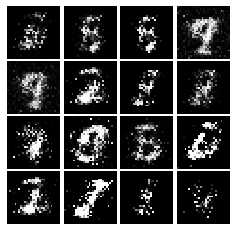

Epoch: 3, Iter: 1840, D: 1.31, G:0.9309


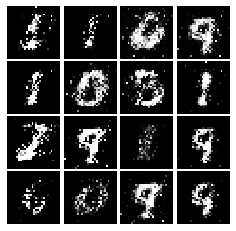

Epoch: 3, Iter: 1860, D: 1.22, G:0.9352


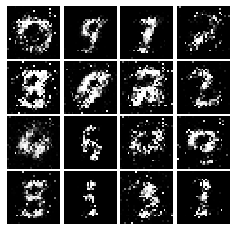

Epoch: 4, Iter: 1880, D: 1.269, G:0.9993


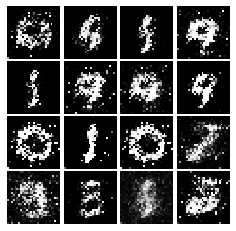

Epoch: 4, Iter: 1900, D: 1.26, G:0.918


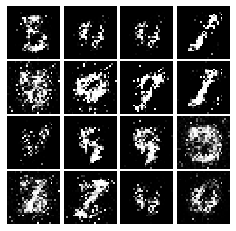

Epoch: 4, Iter: 1920, D: 1.237, G:0.9007


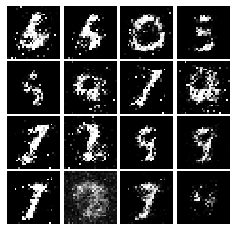

Epoch: 4, Iter: 1940, D: 1.231, G:0.9791


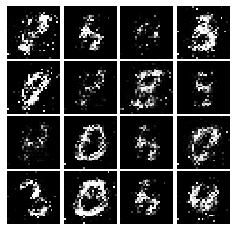

Epoch: 4, Iter: 1960, D: 1.167, G:0.8986


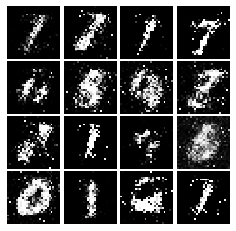

Epoch: 4, Iter: 1980, D: 1.162, G:1.207


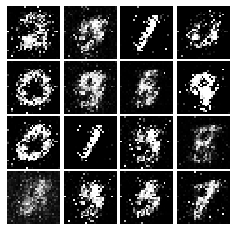

Epoch: 4, Iter: 2000, D: 1.303, G:0.9635


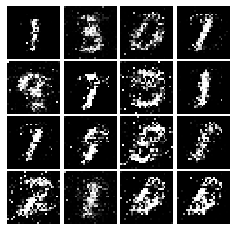

Epoch: 4, Iter: 2020, D: 1.329, G:1.248


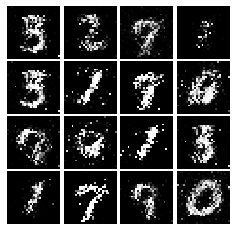

Epoch: 4, Iter: 2040, D: 1.332, G:1.047


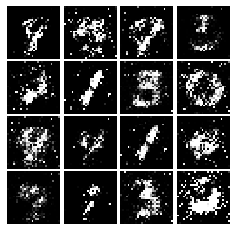

Epoch: 4, Iter: 2060, D: 1.404, G:0.8115


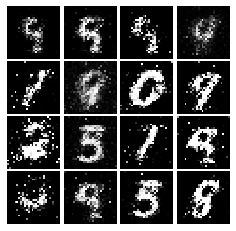

Epoch: 4, Iter: 2080, D: 1.344, G:0.973


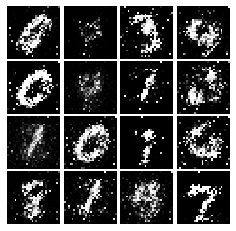

Epoch: 4, Iter: 2100, D: 1.162, G:0.8481


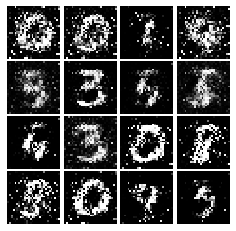

Epoch: 4, Iter: 2120, D: 1.219, G:1.285


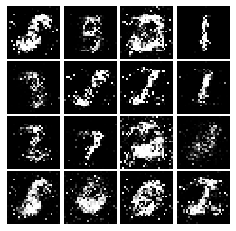

Epoch: 4, Iter: 2140, D: 1.39, G:0.83


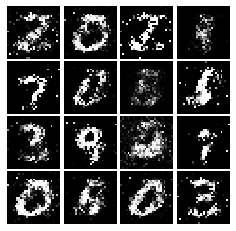

Epoch: 4, Iter: 2160, D: 1.428, G:1.034


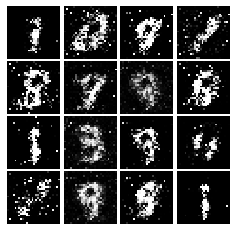

Epoch: 4, Iter: 2180, D: 1.266, G:0.9683


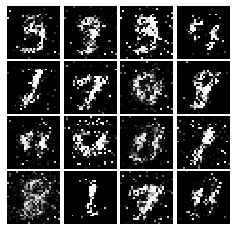

Epoch: 4, Iter: 2200, D: 1.225, G:0.9894


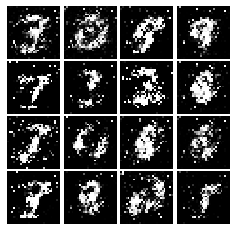

Epoch: 4, Iter: 2220, D: 1.163, G:1.095


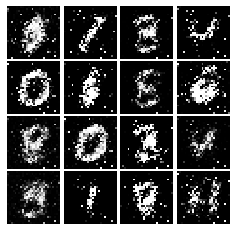

Epoch: 4, Iter: 2240, D: 1.137, G:0.9337


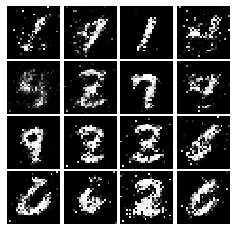

Epoch: 4, Iter: 2260, D: 1.216, G:0.977


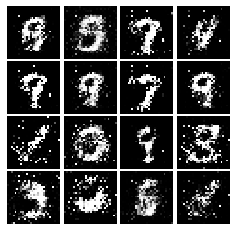

Epoch: 4, Iter: 2280, D: 1.342, G:0.8929


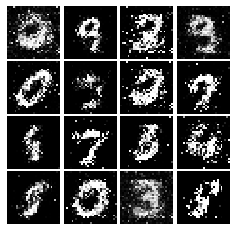

Epoch: 4, Iter: 2300, D: 1.32, G:0.8663


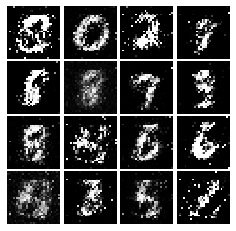

Epoch: 4, Iter: 2320, D: 1.184, G:1.067


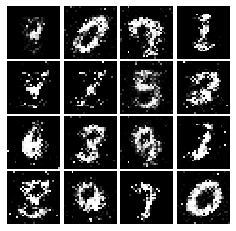

Epoch: 4, Iter: 2340, D: 1.181, G:0.892


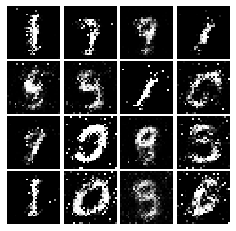

Epoch: 5, Iter: 2360, D: 1.286, G:0.8691


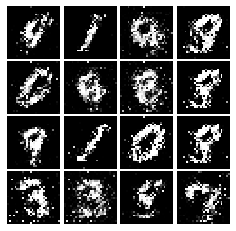

Epoch: 5, Iter: 2380, D: 1.26, G:0.8838


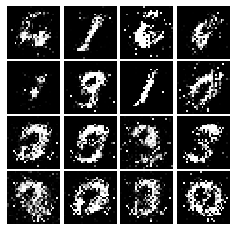

Epoch: 5, Iter: 2400, D: 1.289, G:0.8292


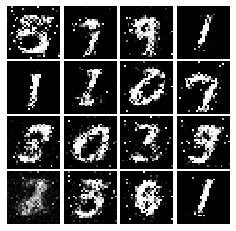

Epoch: 5, Iter: 2420, D: 1.27, G:0.9856


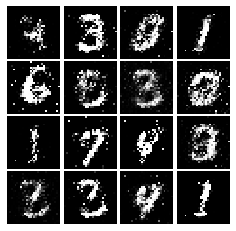

Epoch: 5, Iter: 2440, D: 1.385, G:0.8079


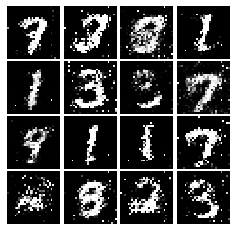

Epoch: 5, Iter: 2460, D: 1.189, G:1.106


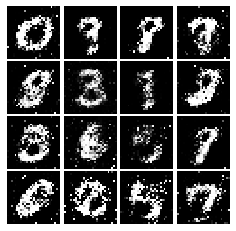

Epoch: 5, Iter: 2480, D: 1.271, G:0.8854


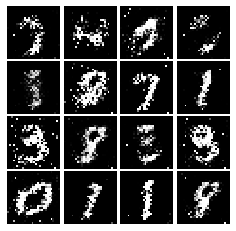

Epoch: 5, Iter: 2500, D: 1.171, G:0.9962


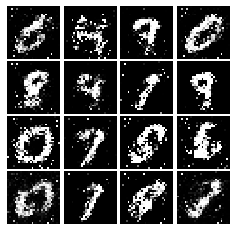

Epoch: 5, Iter: 2520, D: 1.236, G:1.175


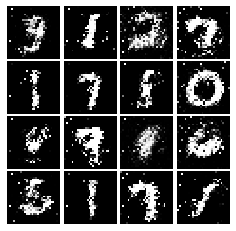

Epoch: 5, Iter: 2540, D: 1.36, G:0.8882


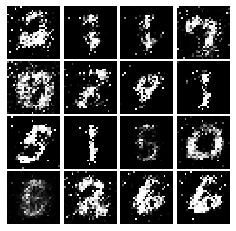

Epoch: 5, Iter: 2560, D: 1.293, G:0.9273


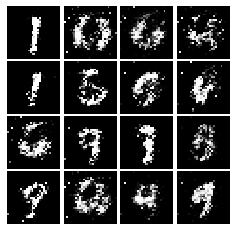

Epoch: 5, Iter: 2580, D: 1.247, G:0.8807


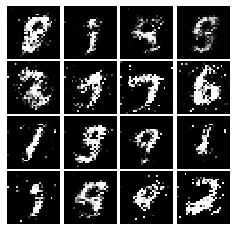

Epoch: 5, Iter: 2600, D: 1.609, G:0.7892


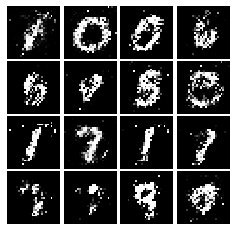

Epoch: 5, Iter: 2620, D: 1.361, G:0.8676


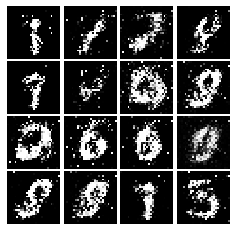

Epoch: 5, Iter: 2640, D: 1.401, G:0.8542


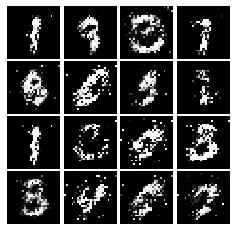

Epoch: 5, Iter: 2660, D: 1.351, G:1.064


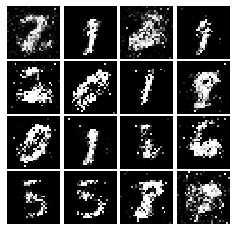

Epoch: 5, Iter: 2680, D: 1.337, G:0.9286


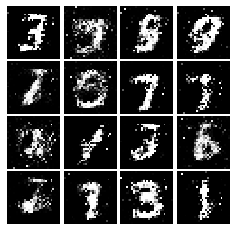

Epoch: 5, Iter: 2700, D: 1.457, G:0.7623


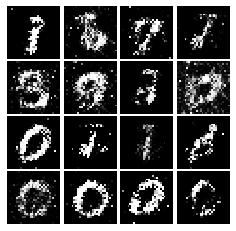

Epoch: 5, Iter: 2720, D: 1.356, G:0.851


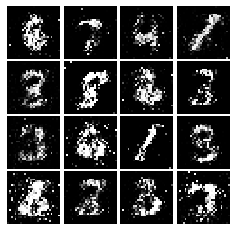

Epoch: 5, Iter: 2740, D: 1.275, G:0.8838


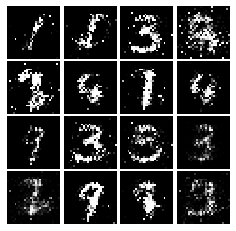

Epoch: 5, Iter: 2760, D: 1.349, G:0.7553


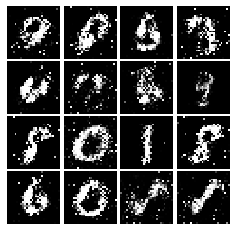

Epoch: 5, Iter: 2780, D: 1.264, G:0.7558


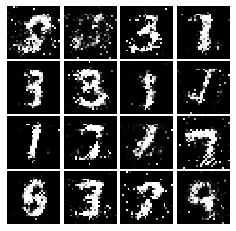

Epoch: 5, Iter: 2800, D: 1.179, G:0.8899


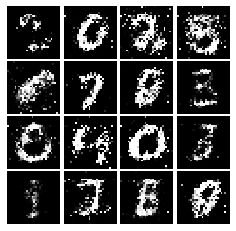

Epoch: 6, Iter: 2820, D: 1.29, G:0.9246


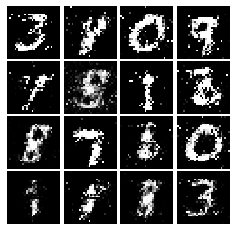

Epoch: 6, Iter: 2840, D: 1.289, G:0.8554


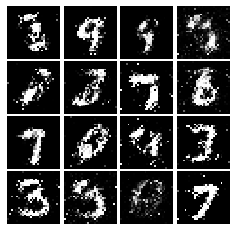

Epoch: 6, Iter: 2860, D: 1.258, G:0.8428


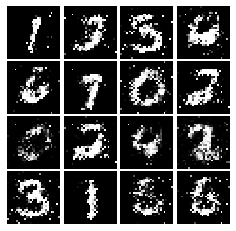

Epoch: 6, Iter: 2880, D: 1.233, G:0.8872


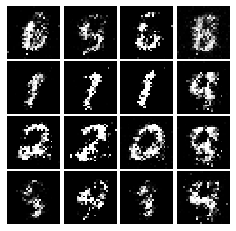

Epoch: 6, Iter: 2900, D: 1.325, G:0.8996


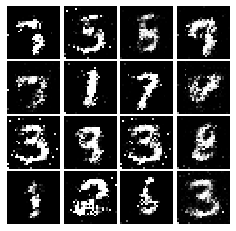

Epoch: 6, Iter: 2920, D: 1.361, G:0.8266


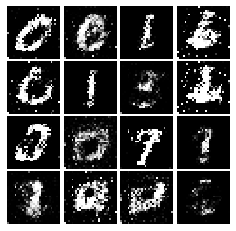

Epoch: 6, Iter: 2940, D: 1.338, G:0.8744


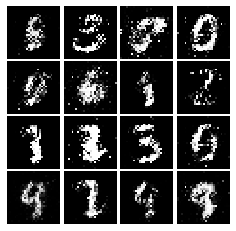

Epoch: 6, Iter: 2960, D: 1.371, G:0.7532


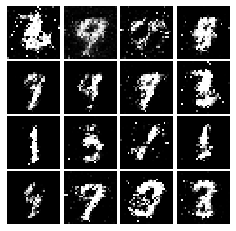

Epoch: 6, Iter: 2980, D: 1.362, G:1.2


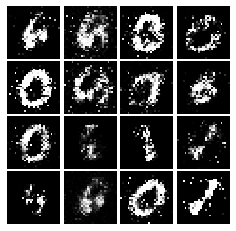

Epoch: 6, Iter: 3000, D: 1.252, G:0.8706


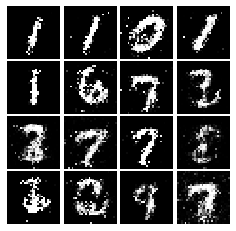

Epoch: 6, Iter: 3020, D: 1.322, G:0.8355


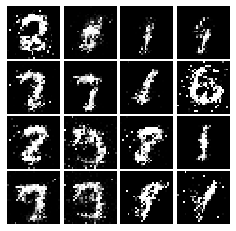

Epoch: 6, Iter: 3040, D: 1.314, G:0.8234


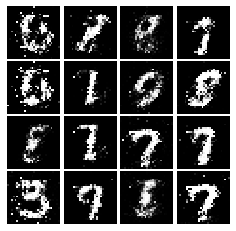

Epoch: 6, Iter: 3060, D: 1.34, G:0.8462


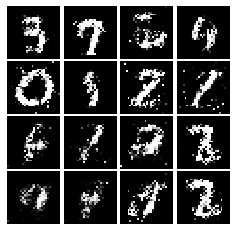

Epoch: 6, Iter: 3080, D: 1.319, G:0.832


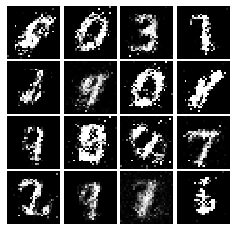

Epoch: 6, Iter: 3100, D: 1.355, G:0.8015


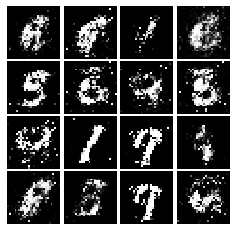

Epoch: 6, Iter: 3120, D: 1.376, G:0.7969


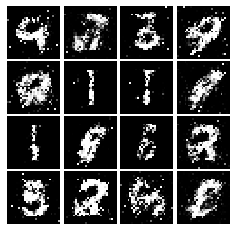

Epoch: 6, Iter: 3140, D: 1.34, G:0.8459


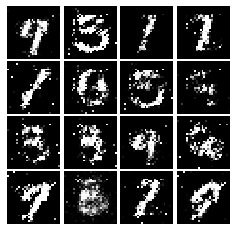

Epoch: 6, Iter: 3160, D: 1.348, G:0.8918


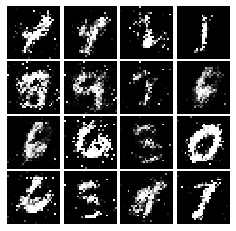

Epoch: 6, Iter: 3180, D: 1.352, G:0.9456


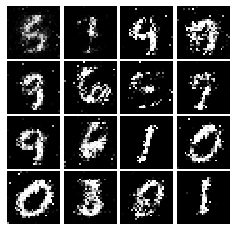

Epoch: 6, Iter: 3200, D: 1.366, G:0.7913


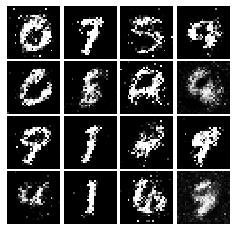

Epoch: 6, Iter: 3220, D: 1.46, G:0.8452


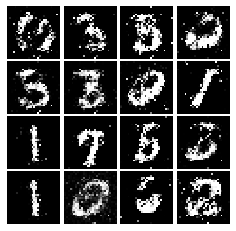

Epoch: 6, Iter: 3240, D: 1.31, G:0.8611


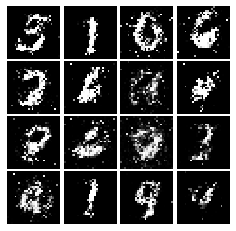

Epoch: 6, Iter: 3260, D: 1.276, G:0.5081


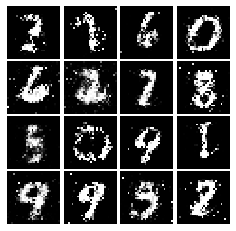

Epoch: 6, Iter: 3280, D: 1.343, G:0.6883


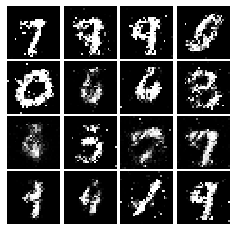

Epoch: 7, Iter: 3300, D: 1.26, G:0.8595


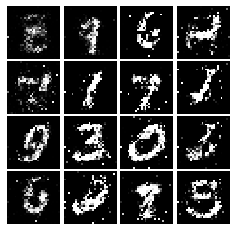

Epoch: 7, Iter: 3320, D: 1.219, G:0.8838


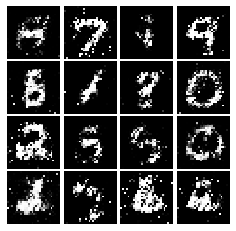

Epoch: 7, Iter: 3340, D: 1.346, G:0.8331


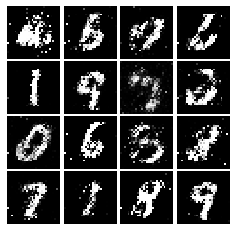

Epoch: 7, Iter: 3360, D: 1.37, G:0.8242


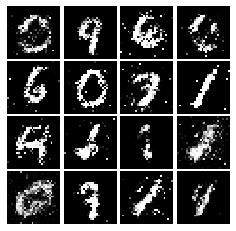

Epoch: 7, Iter: 3380, D: 1.349, G:0.7461


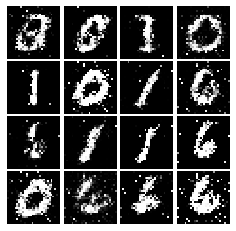

Epoch: 7, Iter: 3400, D: 1.613, G:0.6338


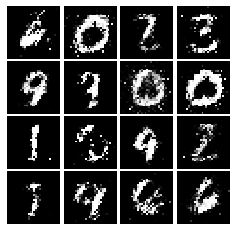

Epoch: 7, Iter: 3420, D: 1.355, G:0.7355


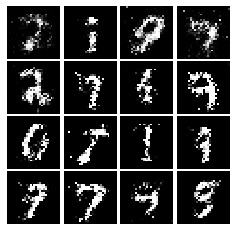

Epoch: 7, Iter: 3440, D: 1.336, G:0.8846


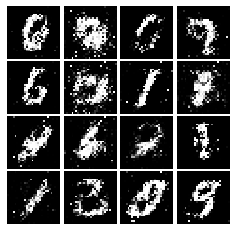

Epoch: 7, Iter: 3460, D: 1.344, G:0.7934


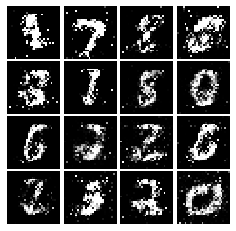

Epoch: 7, Iter: 3480, D: 1.333, G:0.7385


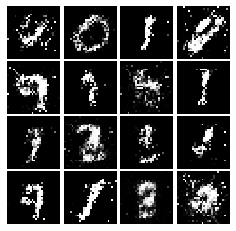

Epoch: 7, Iter: 3500, D: 1.285, G:0.946


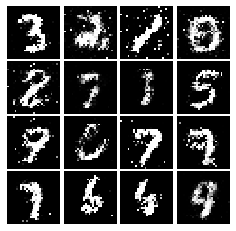

Epoch: 7, Iter: 3520, D: 1.326, G:0.7392


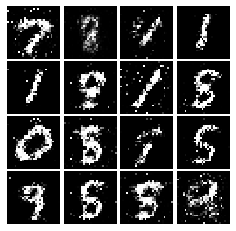

Epoch: 7, Iter: 3540, D: 1.309, G:0.8322


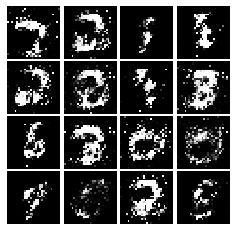

Epoch: 7, Iter: 3560, D: 1.281, G:0.8066


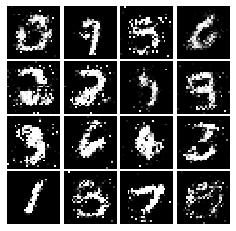

Epoch: 7, Iter: 3580, D: 1.327, G:0.7906


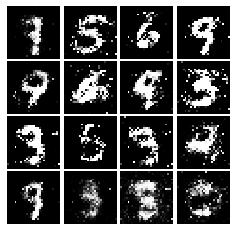

Epoch: 7, Iter: 3600, D: 1.331, G:0.8023


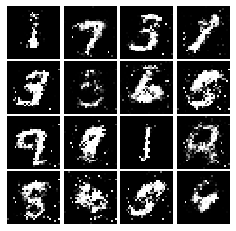

Epoch: 7, Iter: 3620, D: 1.266, G:0.7732


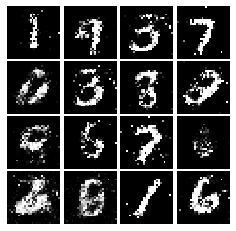

Epoch: 7, Iter: 3640, D: 1.409, G:0.753


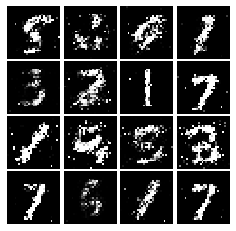

Epoch: 7, Iter: 3660, D: 1.298, G:0.9293


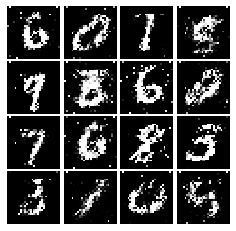

Epoch: 7, Iter: 3680, D: 1.341, G:0.8873


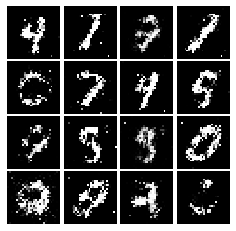

Epoch: 7, Iter: 3700, D: 1.431, G:0.8069


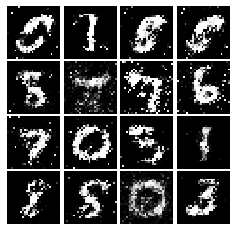

Epoch: 7, Iter: 3720, D: 1.367, G:0.8269


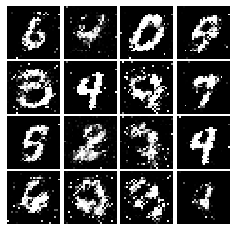

Epoch: 7, Iter: 3740, D: 1.336, G:1.149


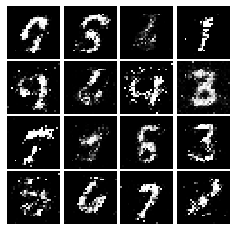

Epoch: 8, Iter: 3760, D: 1.223, G:0.6051


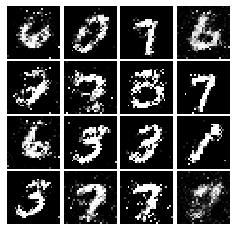

Epoch: 8, Iter: 3780, D: 1.343, G:0.8824


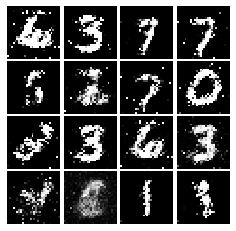

Epoch: 8, Iter: 3800, D: 1.382, G:0.7575


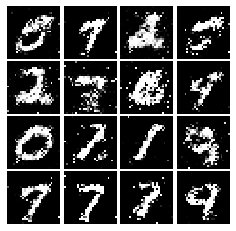

Epoch: 8, Iter: 3820, D: 1.361, G:0.7558


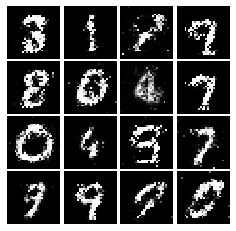

Epoch: 8, Iter: 3840, D: 1.378, G:0.8054


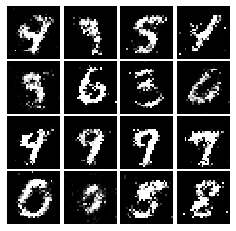

Epoch: 8, Iter: 3860, D: 1.304, G:0.8072


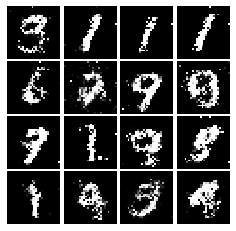

Epoch: 8, Iter: 3880, D: 1.209, G:0.8796


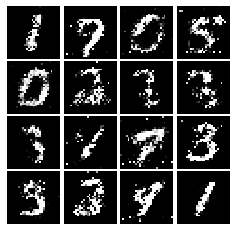

Epoch: 8, Iter: 3900, D: 1.428, G:0.8017


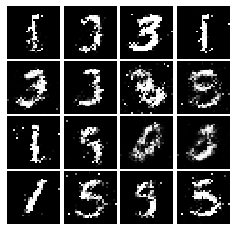

Epoch: 8, Iter: 3920, D: 1.359, G:0.7979


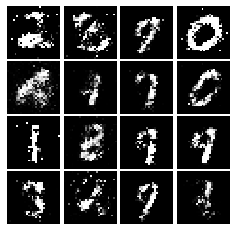

Epoch: 8, Iter: 3940, D: 1.375, G:0.9141


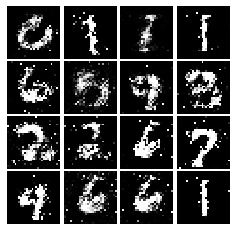

Epoch: 8, Iter: 3960, D: 1.346, G:0.8174


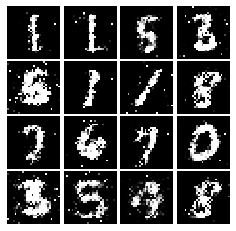

Epoch: 8, Iter: 3980, D: 1.341, G:0.8205


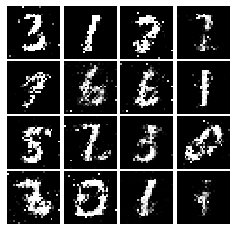

Epoch: 8, Iter: 4000, D: 1.215, G:0.8956


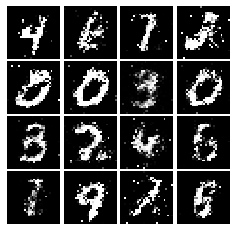

Epoch: 8, Iter: 4020, D: 1.417, G:0.7361


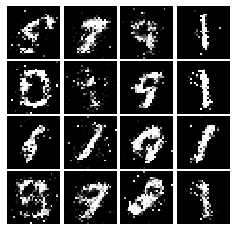

Epoch: 8, Iter: 4040, D: 1.34, G:0.8437


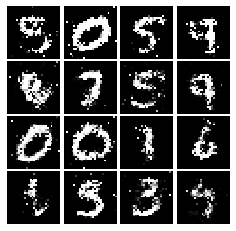

Epoch: 8, Iter: 4060, D: 1.338, G:0.7563


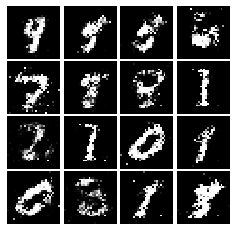

Epoch: 8, Iter: 4080, D: 1.453, G:0.7912


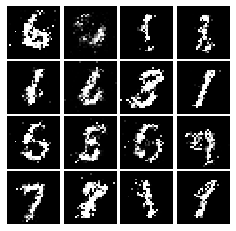

Epoch: 8, Iter: 4100, D: 1.312, G:0.7702


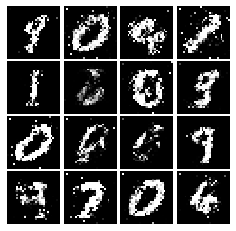

Epoch: 8, Iter: 4120, D: 1.353, G:0.7803


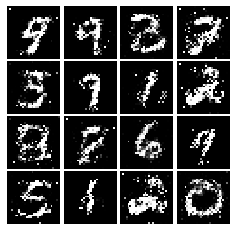

Epoch: 8, Iter: 4140, D: 1.445, G:1.753


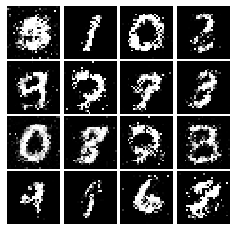

Epoch: 8, Iter: 4160, D: 1.314, G:0.7349


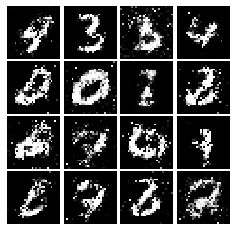

Epoch: 8, Iter: 4180, D: 1.401, G:0.6238


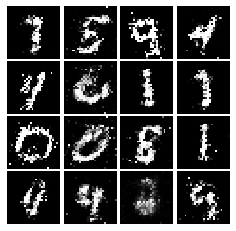

Epoch: 8, Iter: 4200, D: 1.385, G:0.8446


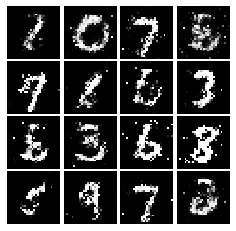

Epoch: 8, Iter: 4220, D: 1.445, G:0.8435


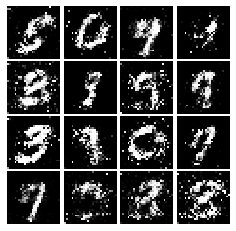

Epoch: 9, Iter: 4240, D: 1.423, G:0.7963


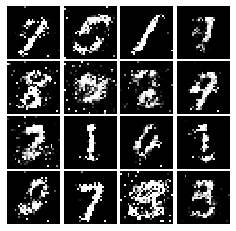

Epoch: 9, Iter: 4260, D: 1.411, G:0.852


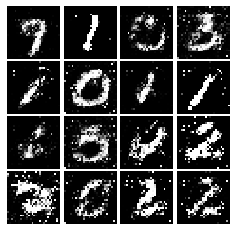

Epoch: 9, Iter: 4280, D: 1.213, G:1.274


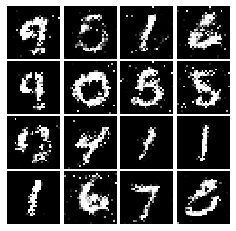

Epoch: 9, Iter: 4300, D: 1.268, G:0.9125


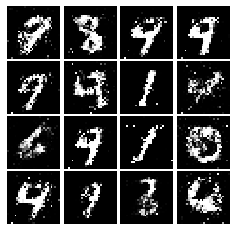

Epoch: 9, Iter: 4320, D: 1.349, G:0.7828


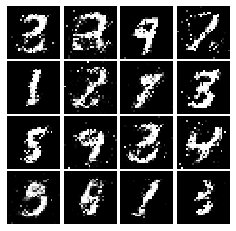

Epoch: 9, Iter: 4340, D: 1.369, G:0.7497


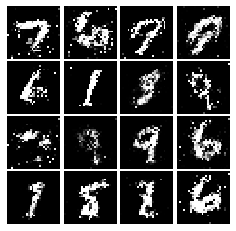

Epoch: 9, Iter: 4360, D: 1.325, G:1.201


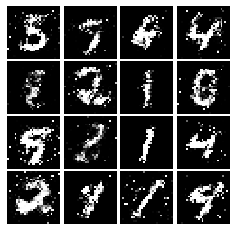

Epoch: 9, Iter: 4380, D: 1.444, G:0.7848


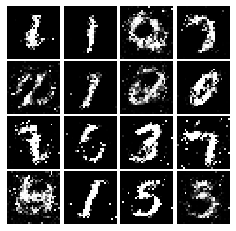

Epoch: 9, Iter: 4400, D: 1.258, G:0.7594


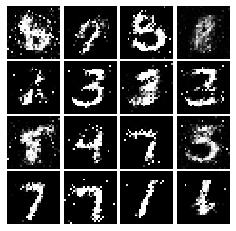

Epoch: 9, Iter: 4420, D: 1.335, G:0.7004


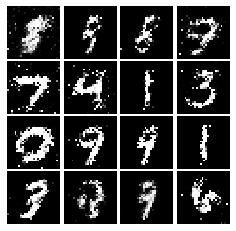

Epoch: 9, Iter: 4440, D: 1.358, G:0.7057


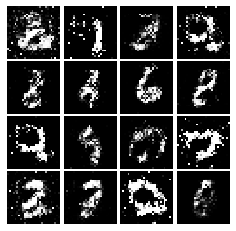

Epoch: 9, Iter: 4460, D: 1.329, G:0.7703


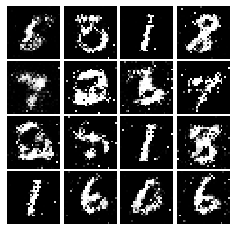

Epoch: 9, Iter: 4480, D: 1.343, G:0.8706


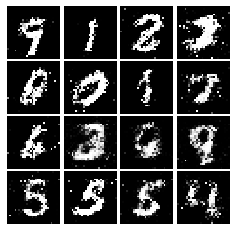

Epoch: 9, Iter: 4500, D: 1.36, G:0.7904


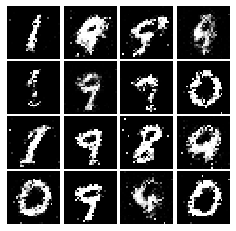

Epoch: 9, Iter: 4520, D: 1.323, G:0.7357


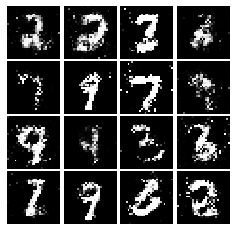

Epoch: 9, Iter: 4540, D: 1.355, G:0.7188


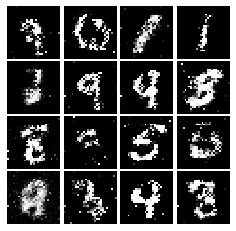

Epoch: 9, Iter: 4560, D: 1.383, G:0.8299


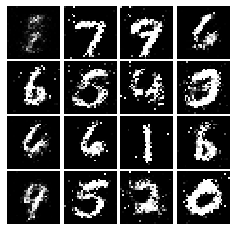

Epoch: 9, Iter: 4580, D: 1.329, G:0.8889


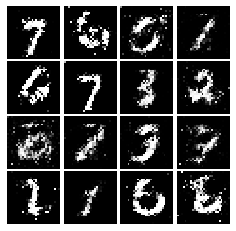

Epoch: 9, Iter: 4600, D: 1.454, G:0.7112


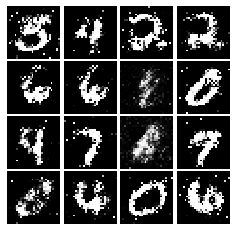

Epoch: 9, Iter: 4620, D: 1.32, G:0.9614


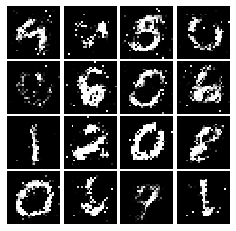

Epoch: 9, Iter: 4640, D: 1.317, G:0.8037


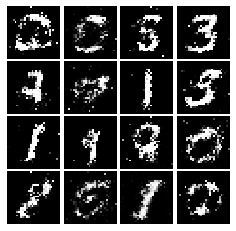

Epoch: 9, Iter: 4660, D: 1.353, G:0.7592


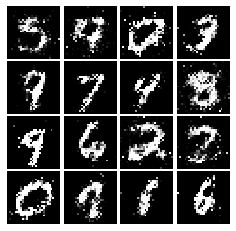

Epoch: 9, Iter: 4680, D: 1.308, G:0.8376


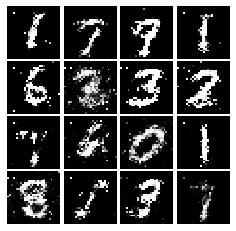

Final images


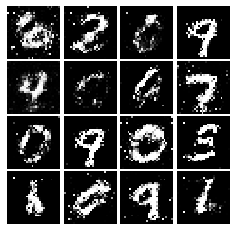

In [31]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [43]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean(tf.square(scores_real-1))+0.5*tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean((tf.square(scores_fake-1)))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [44]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 1.853, G:0.3289


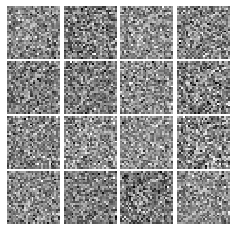

Epoch: 0, Iter: 20, D: 0.04226, G:1.176


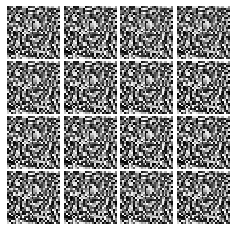

Epoch: 0, Iter: 40, D: 0.01126, G:0.7244


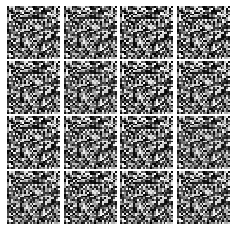

Epoch: 0, Iter: 60, D: 0.009072, G:0.5158


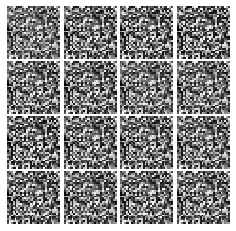

Epoch: 0, Iter: 80, D: 0.08732, G:1.004


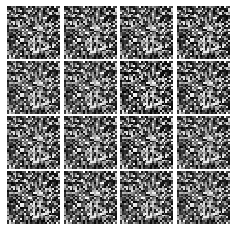

Epoch: 0, Iter: 100, D: 0.01263, G:0.7055


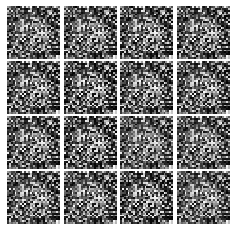

Epoch: 0, Iter: 120, D: 0.1457, G:1.156


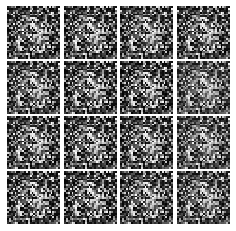

Epoch: 0, Iter: 140, D: 0.02838, G:0.6102


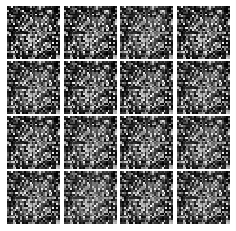

Epoch: 0, Iter: 160, D: 1.159, G:1.643


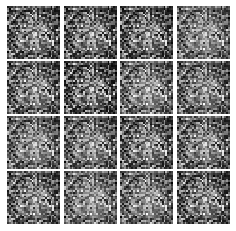

Epoch: 0, Iter: 180, D: 0.1019, G:0.3141


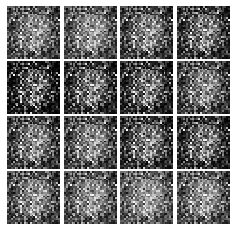

Epoch: 0, Iter: 200, D: 0.09709, G:0.6444


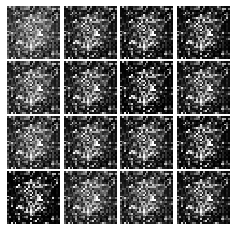

Epoch: 0, Iter: 220, D: 0.08897, G:0.385


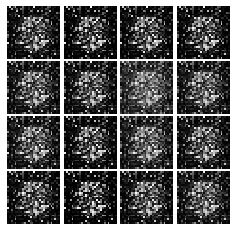

Epoch: 0, Iter: 240, D: 0.1938, G:0.2816


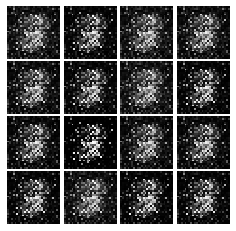

Epoch: 0, Iter: 260, D: 0.1052, G:0.3585


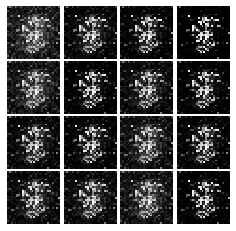

Epoch: 0, Iter: 280, D: 0.1675, G:0.3485


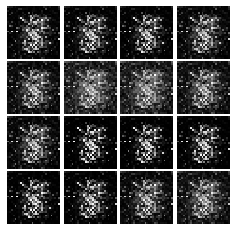

Epoch: 0, Iter: 300, D: 0.2411, G:1.894


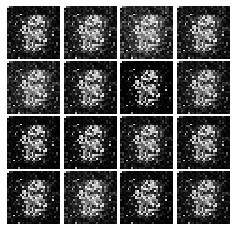

Epoch: 0, Iter: 320, D: 0.1745, G:0.5631


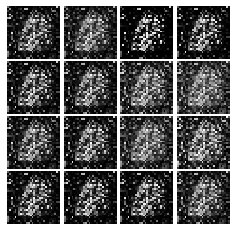

Epoch: 0, Iter: 340, D: 0.1787, G:0.4248


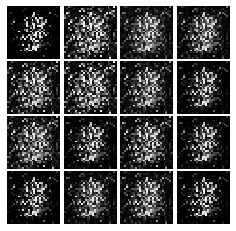

Epoch: 0, Iter: 360, D: 0.1862, G:0.4685


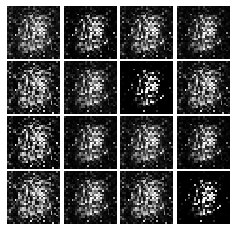

Epoch: 0, Iter: 380, D: 0.1906, G:0.4579


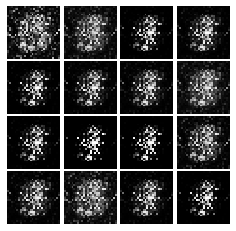

Epoch: 0, Iter: 400, D: 0.1188, G:0.3412


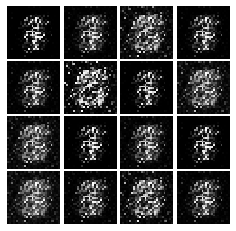

Epoch: 0, Iter: 420, D: 0.1152, G:0.3866


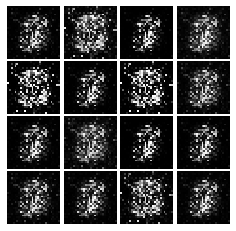

Epoch: 0, Iter: 440, D: 0.1821, G:0.501


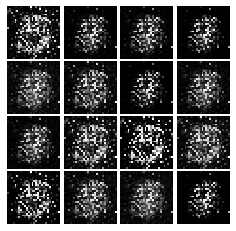

Epoch: 0, Iter: 460, D: 0.1392, G:0.7678


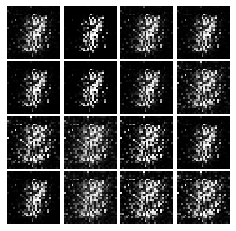

Epoch: 1, Iter: 480, D: 0.2035, G:0.4285


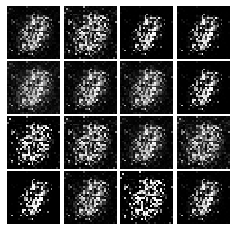

Epoch: 1, Iter: 500, D: 0.1699, G:0.4745


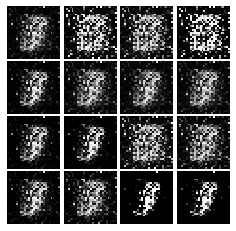

Epoch: 1, Iter: 520, D: 0.09842, G:0.4026


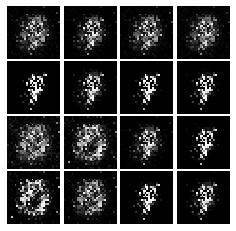

Epoch: 1, Iter: 540, D: 0.4976, G:0.5829


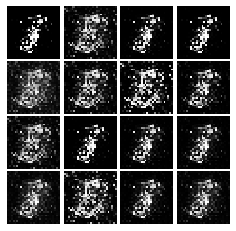

Epoch: 1, Iter: 560, D: 0.1296, G:0.368


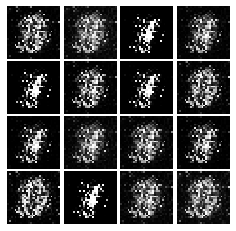

Epoch: 1, Iter: 580, D: 0.1165, G:0.4059


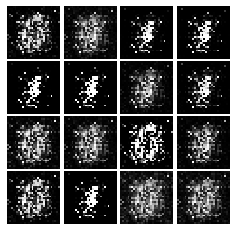

Epoch: 1, Iter: 600, D: 0.1061, G:0.3477


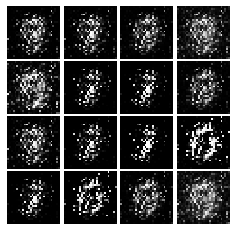

Epoch: 1, Iter: 620, D: 0.129, G:0.3765


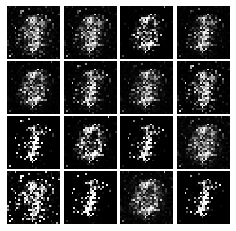

Epoch: 1, Iter: 640, D: 0.161, G:0.3045


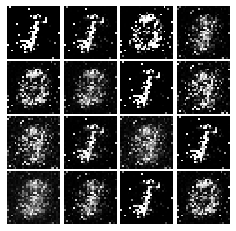

Epoch: 1, Iter: 660, D: 0.1437, G:0.372


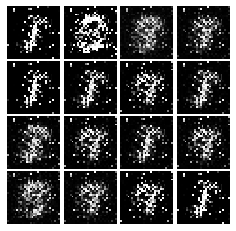

Epoch: 1, Iter: 680, D: 0.3114, G:0.283


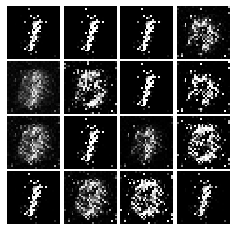

Epoch: 1, Iter: 700, D: 0.1447, G:0.3912


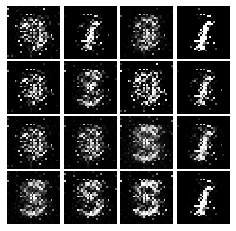

Epoch: 1, Iter: 720, D: 0.1588, G:0.2383


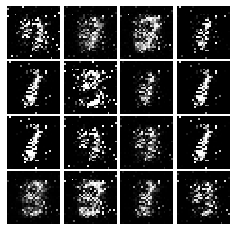

Epoch: 1, Iter: 740, D: 0.177, G:0.2857


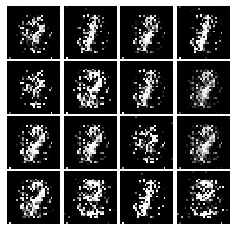

Epoch: 1, Iter: 760, D: 0.1073, G:0.3937


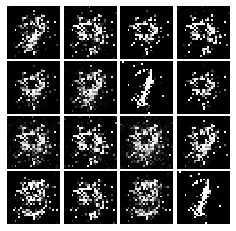

Epoch: 1, Iter: 780, D: 0.2626, G:0.9037


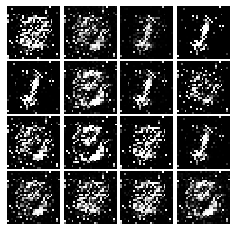

Epoch: 1, Iter: 800, D: 0.07416, G:0.3625


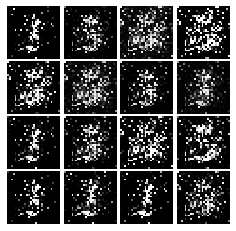

Epoch: 1, Iter: 820, D: 0.1164, G:0.6


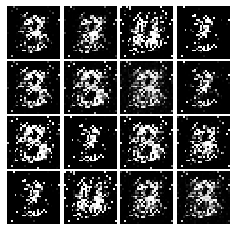

Epoch: 1, Iter: 840, D: 0.3005, G:0.2582


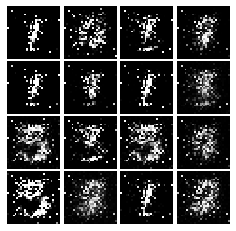

Epoch: 1, Iter: 860, D: 0.1882, G:0.1976


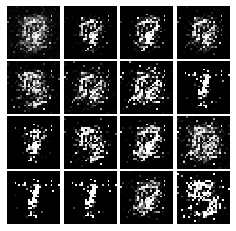

Epoch: 1, Iter: 880, D: 0.2288, G:0.4655


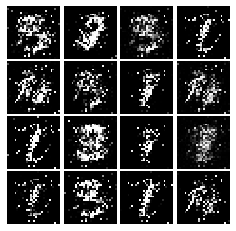

Epoch: 1, Iter: 900, D: 0.1633, G:0.2615


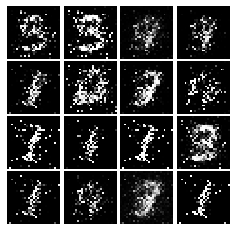

Epoch: 1, Iter: 920, D: 0.1341, G:0.2385


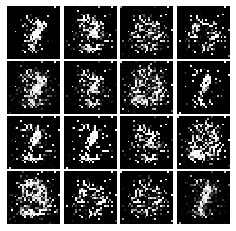

Epoch: 2, Iter: 940, D: 0.1494, G:0.3945


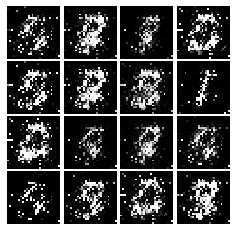

Epoch: 2, Iter: 960, D: 0.1536, G:0.248


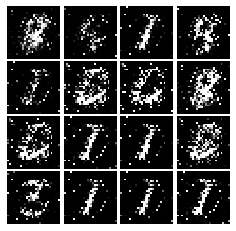

Epoch: 2, Iter: 980, D: 0.1374, G:0.2882


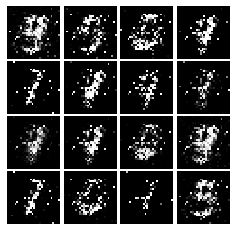

Epoch: 2, Iter: 1000, D: 0.09022, G:0.4355


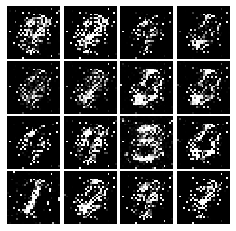

Epoch: 2, Iter: 1020, D: 0.4958, G:0.5451


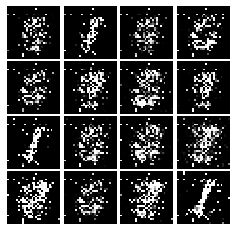

Epoch: 2, Iter: 1040, D: 0.1397, G:0.4065


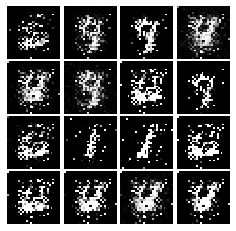

Epoch: 2, Iter: 1060, D: 0.1694, G:0.2162


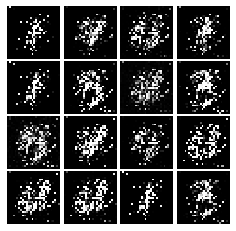

Epoch: 2, Iter: 1080, D: 0.1752, G:0.3045


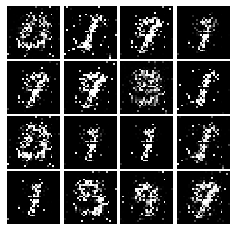

Epoch: 2, Iter: 1100, D: 0.1045, G:0.7744


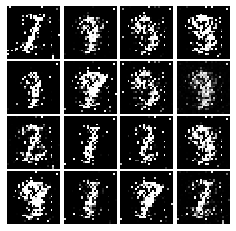

Epoch: 2, Iter: 1120, D: 0.1536, G:0.2485


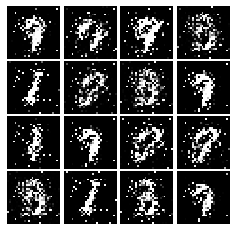

Epoch: 2, Iter: 1140, D: 0.1632, G:0.2199


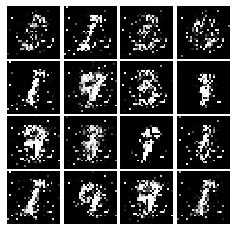

Epoch: 2, Iter: 1160, D: 0.1997, G:0.07189


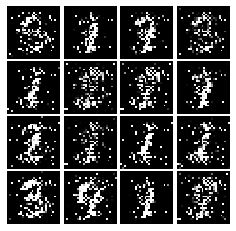

Epoch: 2, Iter: 1180, D: 0.07419, G:0.4793


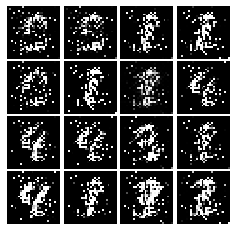

Epoch: 2, Iter: 1200, D: 0.1198, G:0.2927


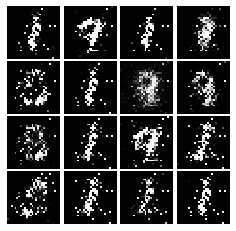

Epoch: 2, Iter: 1220, D: 0.1205, G:0.4382


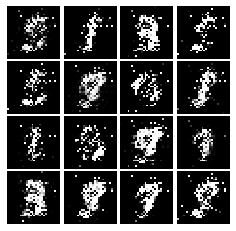

Epoch: 2, Iter: 1240, D: 0.08842, G:0.3271


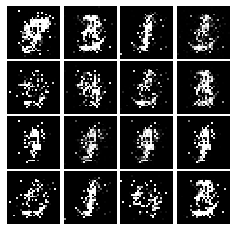

Epoch: 2, Iter: 1260, D: 0.0867, G:0.3423


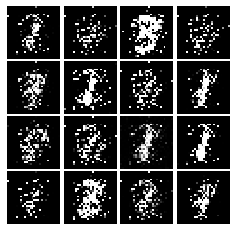

Epoch: 2, Iter: 1280, D: 0.1715, G:0.3128


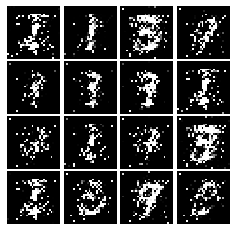

Epoch: 2, Iter: 1300, D: 0.1309, G:0.3324


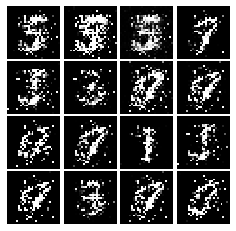

Epoch: 2, Iter: 1320, D: 0.1189, G:0.3357


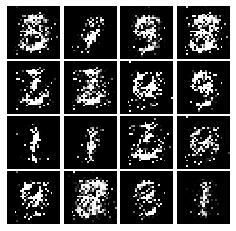

Epoch: 2, Iter: 1340, D: 0.106, G:0.8886


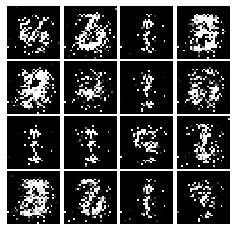

Epoch: 2, Iter: 1360, D: 0.141, G:0.3062


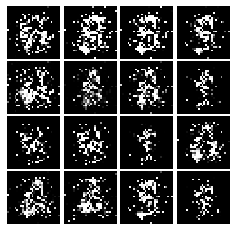

Epoch: 2, Iter: 1380, D: 0.08239, G:0.4662


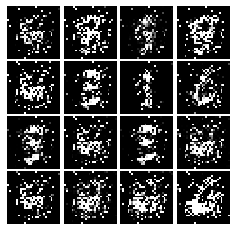

Epoch: 2, Iter: 1400, D: 0.1477, G:1.196


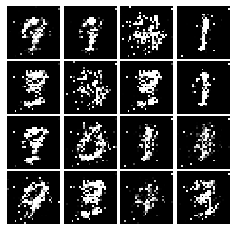

Epoch: 3, Iter: 1420, D: 0.1203, G:0.8413


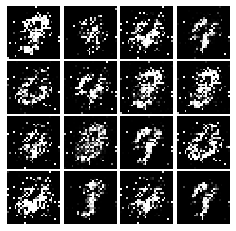

Epoch: 3, Iter: 1440, D: 0.1203, G:0.5083


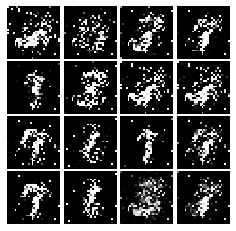

Epoch: 3, Iter: 1460, D: 0.1547, G:0.7842


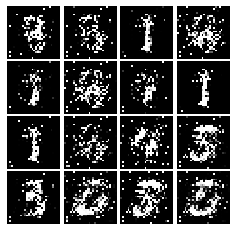

Epoch: 3, Iter: 1480, D: 0.1516, G:0.3011


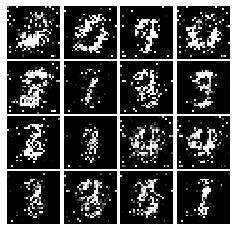

Epoch: 3, Iter: 1500, D: 0.1556, G:0.3416


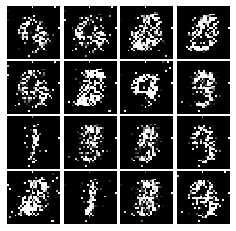

Epoch: 3, Iter: 1520, D: 0.2041, G:0.2207


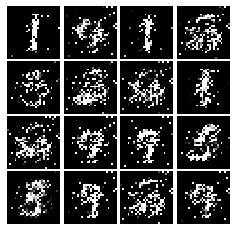

Epoch: 3, Iter: 1540, D: 0.1446, G:0.06331


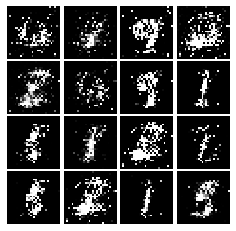

Epoch: 3, Iter: 1560, D: 0.1367, G:0.3896


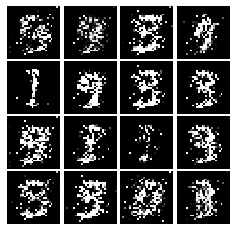

Epoch: 3, Iter: 1580, D: 0.1965, G:0.3533


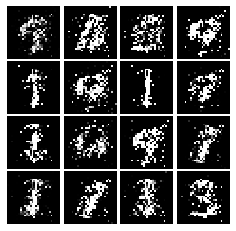

Epoch: 3, Iter: 1600, D: 0.1502, G:0.2635


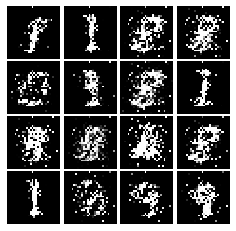

Epoch: 3, Iter: 1620, D: 0.1407, G:0.2975


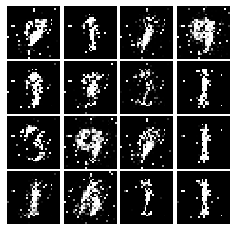

Epoch: 3, Iter: 1640, D: 0.2018, G:0.2509


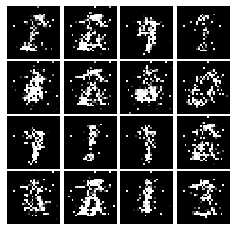

Epoch: 3, Iter: 1660, D: 0.1136, G:0.3224


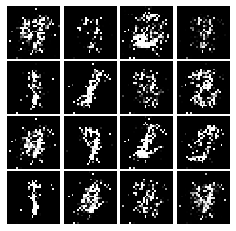

Epoch: 3, Iter: 1680, D: 0.1685, G:0.2403


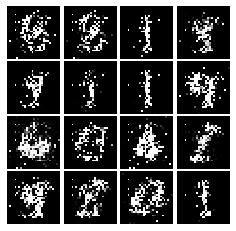

Epoch: 3, Iter: 1700, D: 0.1542, G:0.2453


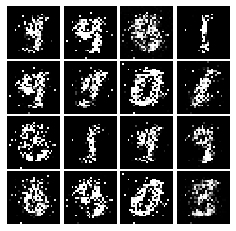

Epoch: 3, Iter: 1720, D: 0.2334, G:0.3413


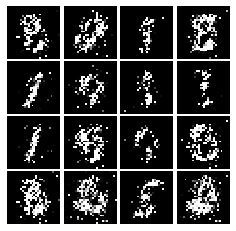

Epoch: 3, Iter: 1740, D: 0.1746, G:0.2539


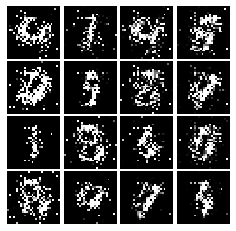

Epoch: 3, Iter: 1760, D: 0.2632, G:0.32


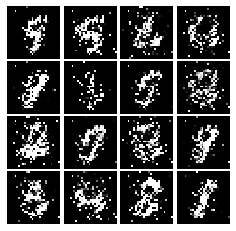

Epoch: 3, Iter: 1780, D: 0.1207, G:0.3224


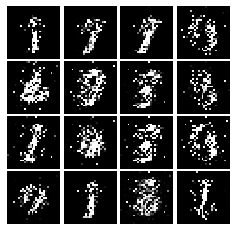

Epoch: 3, Iter: 1800, D: 0.1627, G:0.3095


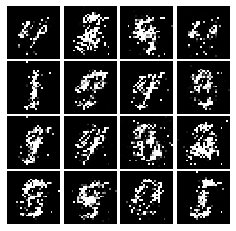

Epoch: 3, Iter: 1820, D: 0.1627, G:0.2617


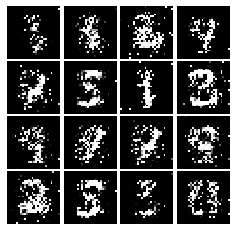

Epoch: 3, Iter: 1840, D: 0.1988, G:0.2225


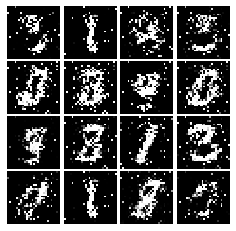

Epoch: 3, Iter: 1860, D: 0.1905, G:0.276


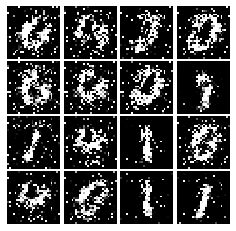

Epoch: 4, Iter: 1880, D: 0.2348, G:0.04409


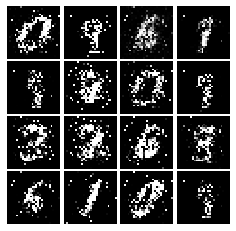

Epoch: 4, Iter: 1900, D: 0.2117, G:0.1678


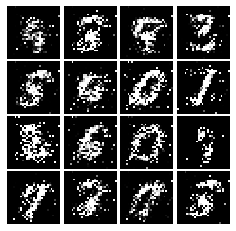

Epoch: 4, Iter: 1920, D: 0.1986, G:0.1924


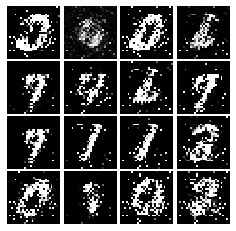

Epoch: 4, Iter: 1940, D: 0.1774, G:0.2415


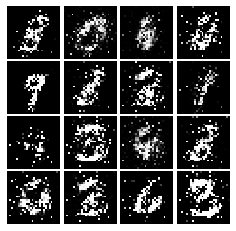

Epoch: 4, Iter: 1960, D: 0.1637, G:0.2476


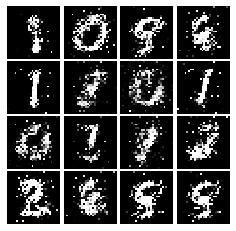

Epoch: 4, Iter: 1980, D: 0.1651, G:0.4108


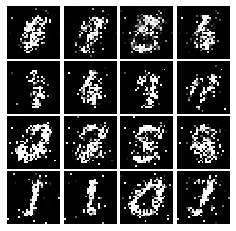

Epoch: 4, Iter: 2000, D: 0.3073, G:0.1659


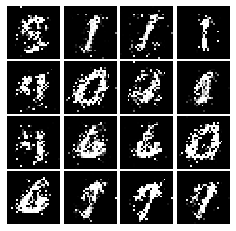

Epoch: 4, Iter: 2020, D: 0.1882, G:0.2123


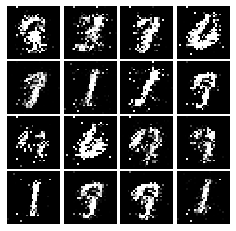

Epoch: 4, Iter: 2040, D: 0.1836, G:0.2231


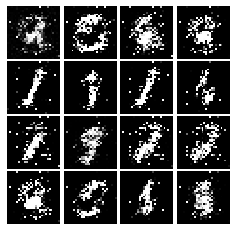

Epoch: 4, Iter: 2060, D: 0.23, G:0.1564


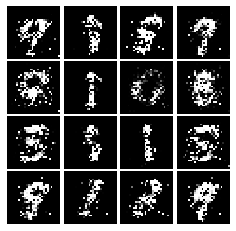

Epoch: 4, Iter: 2080, D: 0.2272, G:0.02788


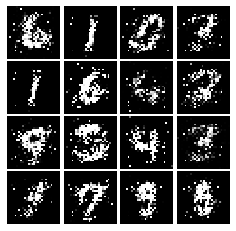

Epoch: 4, Iter: 2100, D: 0.1619, G:0.2319


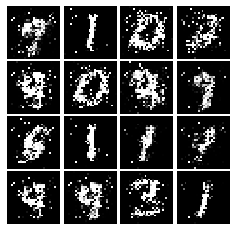

Epoch: 4, Iter: 2120, D: 0.1964, G:0.3856


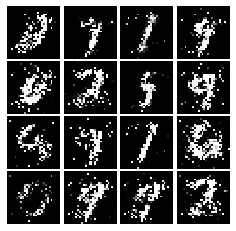

Epoch: 4, Iter: 2140, D: 0.1885, G:0.2218


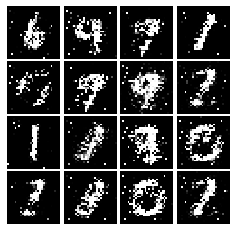

Epoch: 4, Iter: 2160, D: 0.2219, G:0.5198


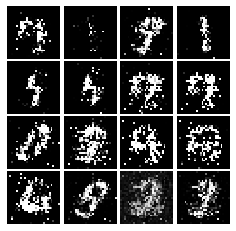

Epoch: 4, Iter: 2180, D: 0.1758, G:0.269


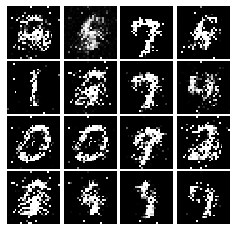

Epoch: 4, Iter: 2200, D: 0.1829, G:0.2611


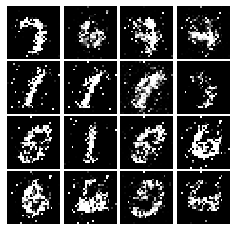

Epoch: 4, Iter: 2220, D: 0.1918, G:0.3168


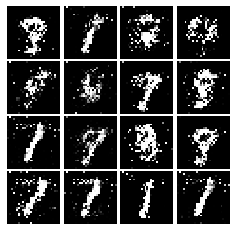

Epoch: 4, Iter: 2240, D: 0.1927, G:0.3135


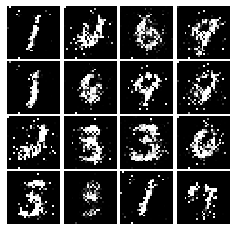

Epoch: 4, Iter: 2260, D: 0.2076, G:0.266


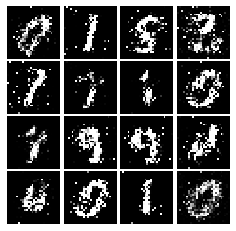

Epoch: 4, Iter: 2280, D: 0.2019, G:0.2517


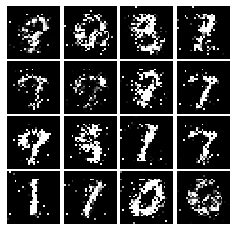

Epoch: 4, Iter: 2300, D: 0.2393, G:0.3467


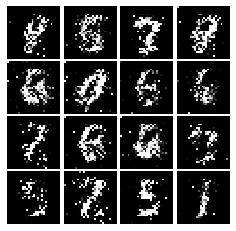

Epoch: 4, Iter: 2320, D: 0.1556, G:0.2242


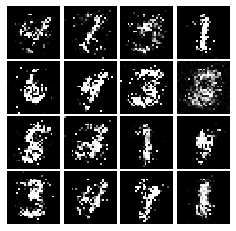

Epoch: 4, Iter: 2340, D: 0.1645, G:0.2761


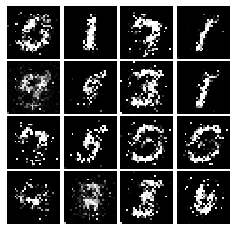

Epoch: 5, Iter: 2360, D: 0.2076, G:0.208


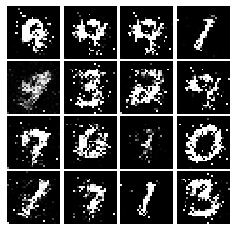

Epoch: 5, Iter: 2380, D: 0.2001, G:0.1862


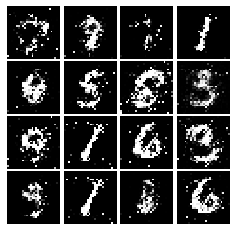

Epoch: 5, Iter: 2400, D: 0.2054, G:0.2071


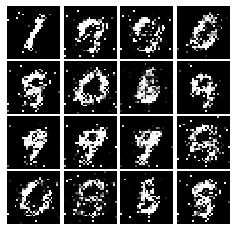

Epoch: 5, Iter: 2420, D: 0.1851, G:0.2771


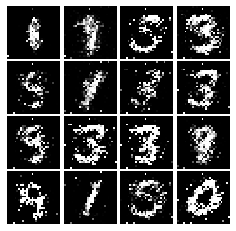

Epoch: 5, Iter: 2440, D: 0.4768, G:0.3348


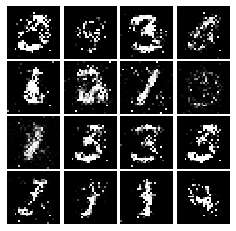

Epoch: 5, Iter: 2460, D: 0.2612, G:0.2028


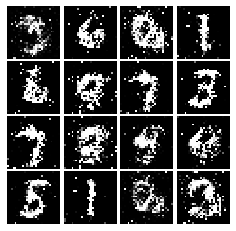

Epoch: 5, Iter: 2480, D: 0.2393, G:0.1936


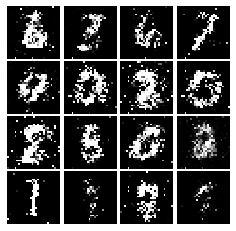

Epoch: 5, Iter: 2500, D: 0.1966, G:0.2002


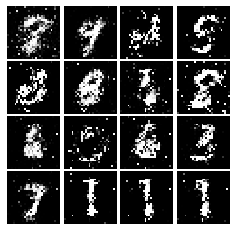

Epoch: 5, Iter: 2520, D: 0.2294, G:0.21


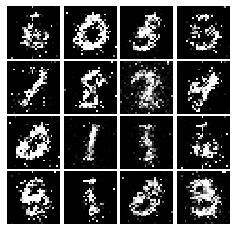

Epoch: 5, Iter: 2540, D: 0.2098, G:0.196


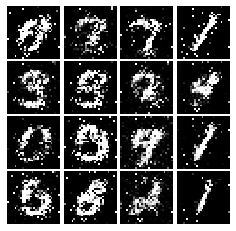

Epoch: 5, Iter: 2560, D: 0.2781, G:0.1803


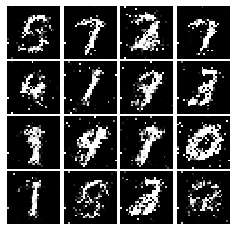

Epoch: 5, Iter: 2580, D: 0.1942, G:0.213


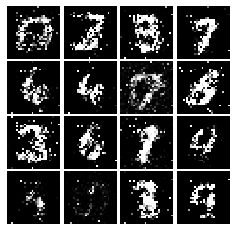

Epoch: 5, Iter: 2600, D: 0.2557, G:0.1416


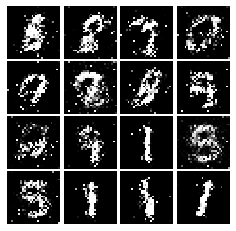

Epoch: 5, Iter: 2620, D: 0.2361, G:0.1861


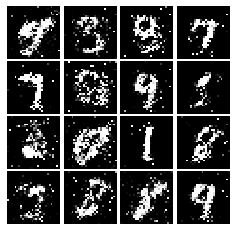

Epoch: 5, Iter: 2640, D: 0.2252, G:0.1989


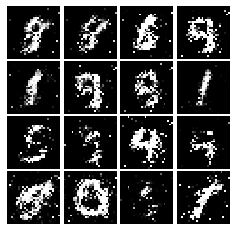

Epoch: 5, Iter: 2660, D: 0.2375, G:0.1013


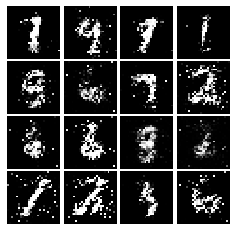

Epoch: 5, Iter: 2680, D: 0.2431, G:0.1983


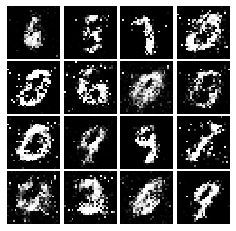

Epoch: 5, Iter: 2700, D: 0.2401, G:0.1487


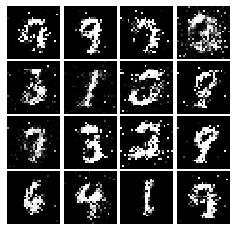

Epoch: 5, Iter: 2720, D: 0.2357, G:0.1956


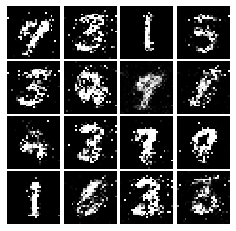

Epoch: 5, Iter: 2740, D: 0.228, G:0.2061


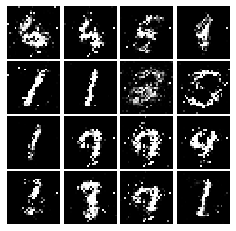

Epoch: 5, Iter: 2760, D: 0.2238, G:0.1773


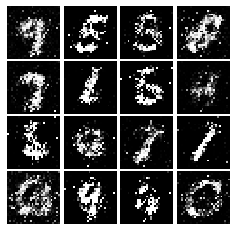

Epoch: 5, Iter: 2780, D: 0.2202, G:0.1592


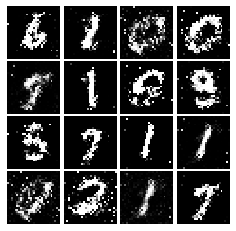

Epoch: 5, Iter: 2800, D: 0.2454, G:0.1564


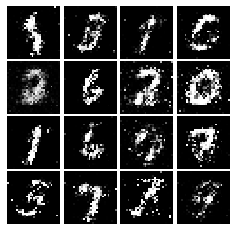

Epoch: 6, Iter: 2820, D: 0.239, G:0.1675


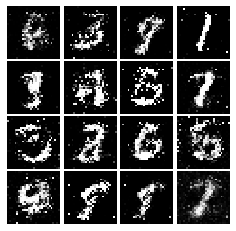

Epoch: 6, Iter: 2840, D: 0.219, G:0.1708


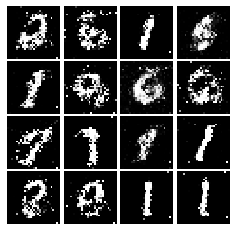

Epoch: 6, Iter: 2860, D: 0.206, G:0.1807


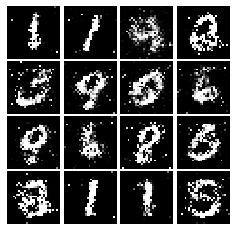

Epoch: 6, Iter: 2880, D: 0.1913, G:0.2071


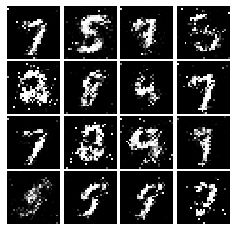

Epoch: 6, Iter: 2900, D: 0.237, G:0.1813


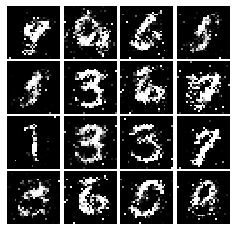

Epoch: 6, Iter: 2920, D: 0.2305, G:0.1873


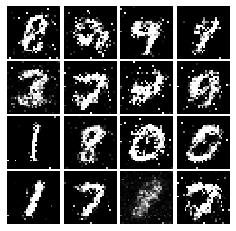

Epoch: 6, Iter: 2940, D: 0.209, G:0.177


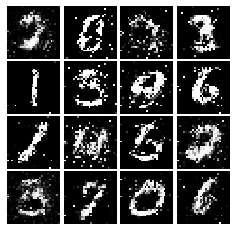

Epoch: 6, Iter: 2960, D: 0.2168, G:0.1544


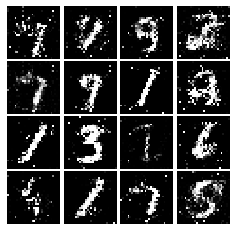

Epoch: 6, Iter: 2980, D: 0.2325, G:0.1569


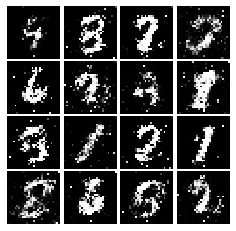

Epoch: 6, Iter: 3000, D: 0.254, G:0.1478


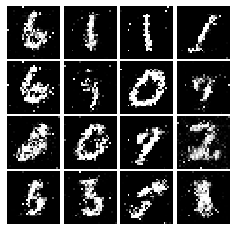

Epoch: 6, Iter: 3020, D: 0.2253, G:0.1864


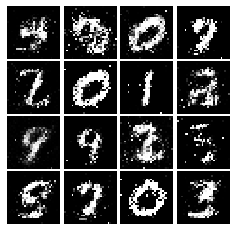

Epoch: 6, Iter: 3040, D: 0.2295, G:0.1695


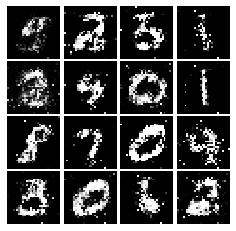

Epoch: 6, Iter: 3060, D: 0.2341, G:0.1652


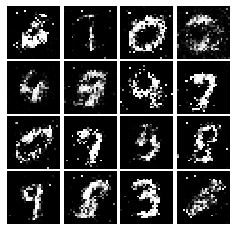

Epoch: 6, Iter: 3080, D: 0.2302, G:0.1694


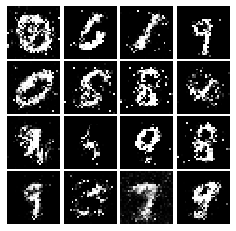

Epoch: 6, Iter: 3100, D: 0.2213, G:0.1882


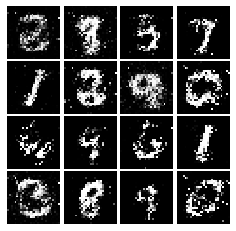

Epoch: 6, Iter: 3120, D: 0.231, G:0.1742


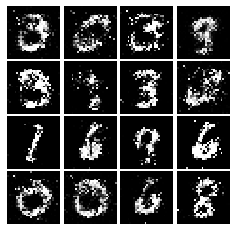

Epoch: 6, Iter: 3140, D: 0.2333, G:0.1752


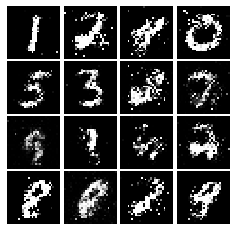

Epoch: 6, Iter: 3160, D: 0.2467, G:0.1769


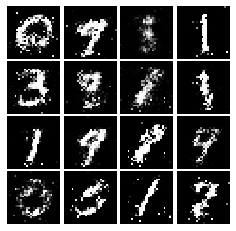

Epoch: 6, Iter: 3180, D: 0.229, G:0.2122


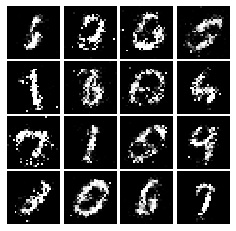

Epoch: 6, Iter: 3200, D: 0.2266, G:0.1975


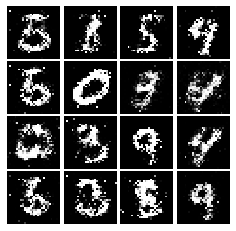

Epoch: 6, Iter: 3220, D: 0.2181, G:0.1615


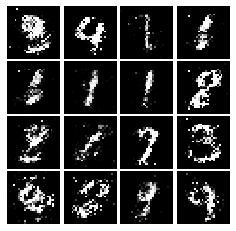

Epoch: 6, Iter: 3240, D: 0.2182, G:0.1625


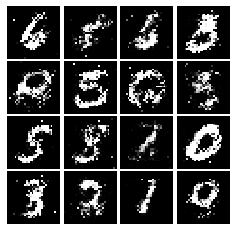

Epoch: 6, Iter: 3260, D: 0.2445, G:0.1952


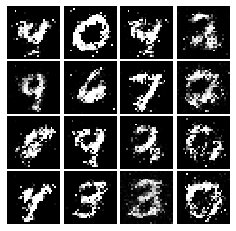

Epoch: 6, Iter: 3280, D: 0.2379, G:0.1559


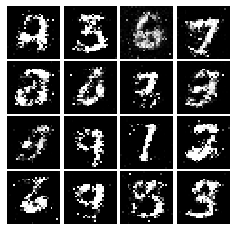

Epoch: 7, Iter: 3300, D: 0.199, G:0.2054


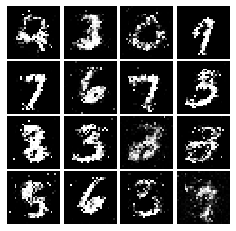

Epoch: 7, Iter: 3320, D: 0.2114, G:0.1611


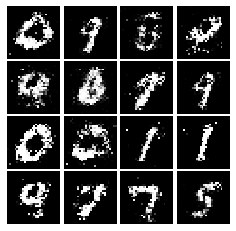

Epoch: 7, Iter: 3340, D: 0.2188, G:0.1703


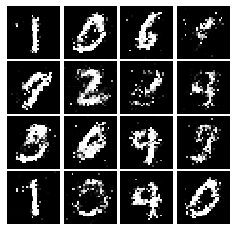

Epoch: 7, Iter: 3360, D: 0.2218, G:0.1839


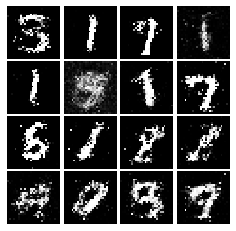

Epoch: 7, Iter: 3380, D: 0.2267, G:0.1677


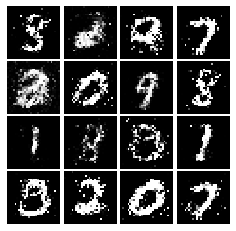

Epoch: 7, Iter: 3400, D: 0.2533, G:0.1539


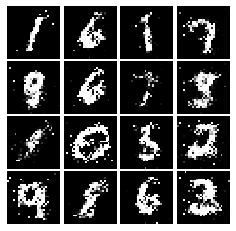

Epoch: 7, Iter: 3420, D: 0.2188, G:0.1599


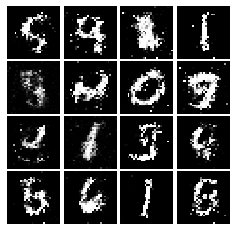

Epoch: 7, Iter: 3440, D: 0.2438, G:0.1815


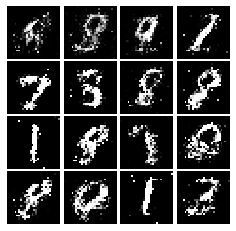

Epoch: 7, Iter: 3460, D: 0.2332, G:0.1568


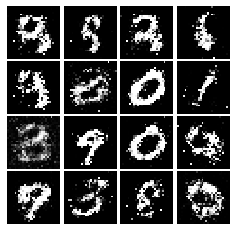

Epoch: 7, Iter: 3480, D: 0.2237, G:0.1696


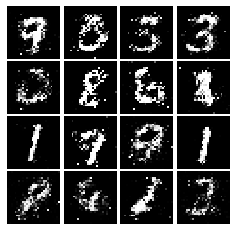

Epoch: 7, Iter: 3500, D: 0.2422, G:0.1831


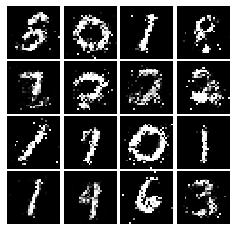

Epoch: 7, Iter: 3520, D: 0.2295, G:0.1678


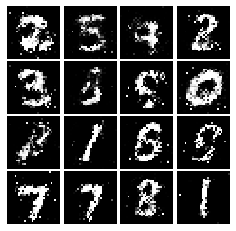

Epoch: 7, Iter: 3540, D: 0.2208, G:0.1687


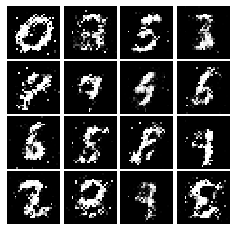

Epoch: 7, Iter: 3560, D: 0.2072, G:0.1801


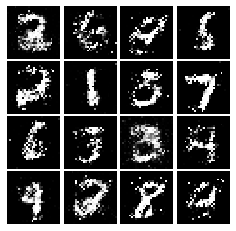

Epoch: 7, Iter: 3580, D: 0.2434, G:0.1881


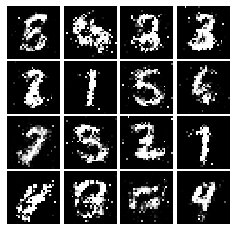

Epoch: 7, Iter: 3600, D: 0.2328, G:0.1675


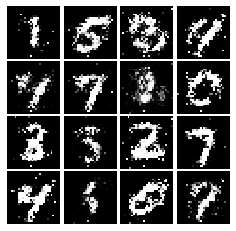

Epoch: 7, Iter: 3620, D: 0.2311, G:0.1674


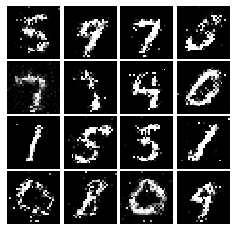

Epoch: 7, Iter: 3640, D: 0.2434, G:0.1795


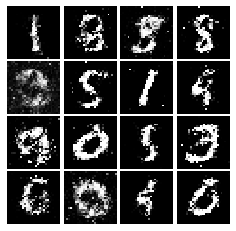

Epoch: 7, Iter: 3660, D: 0.2206, G:0.157


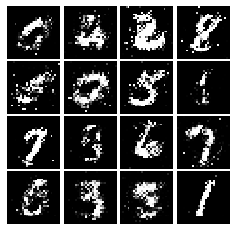

Epoch: 7, Iter: 3680, D: 0.2158, G:0.1721


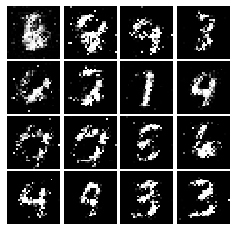

Epoch: 7, Iter: 3700, D: 0.2328, G:0.1695


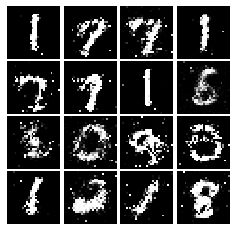

Epoch: 7, Iter: 3720, D: 0.2453, G:0.1713


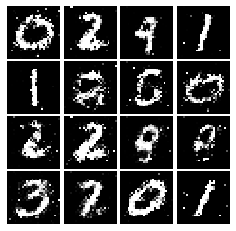

Epoch: 7, Iter: 3740, D: 0.2302, G:0.1566


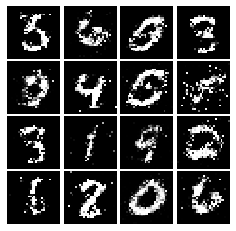

Epoch: 8, Iter: 3760, D: 0.2374, G:0.1433


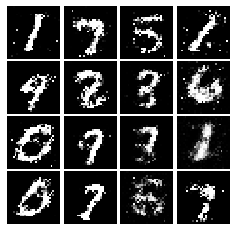

Epoch: 8, Iter: 3780, D: 0.2311, G:0.1562


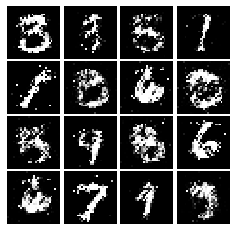

Epoch: 8, Iter: 3800, D: 0.2169, G:0.1641


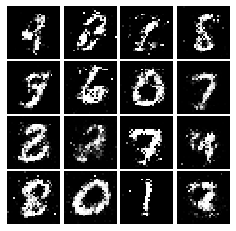

Epoch: 8, Iter: 3820, D: 0.2493, G:0.1645


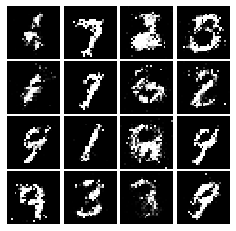

Epoch: 8, Iter: 3840, D: 0.2399, G:0.1664


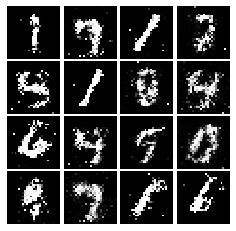

Epoch: 8, Iter: 3860, D: 0.2112, G:0.1667


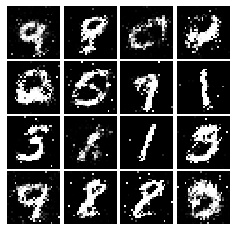

Epoch: 8, Iter: 3880, D: 0.2254, G:0.1542


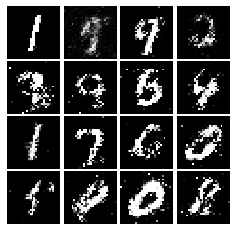

Epoch: 8, Iter: 3900, D: 0.2563, G:0.14


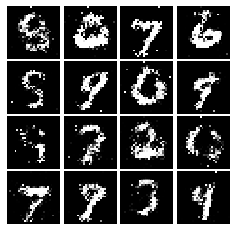

Epoch: 8, Iter: 3920, D: 0.2321, G:0.1754


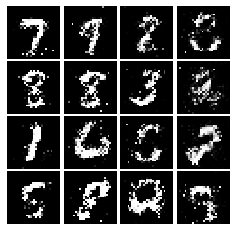

Epoch: 8, Iter: 3940, D: 0.2714, G:0.1673


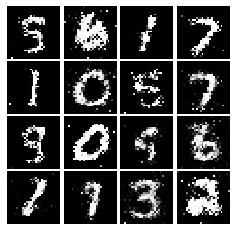

Epoch: 8, Iter: 3960, D: 0.2483, G:0.1606


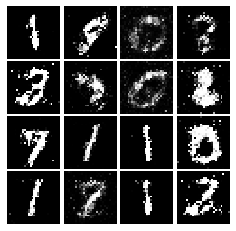

Epoch: 8, Iter: 3980, D: 0.2362, G:0.15


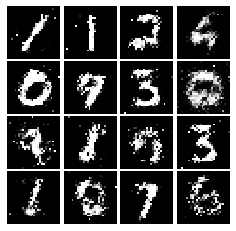

Epoch: 8, Iter: 4000, D: 0.2233, G:0.1766


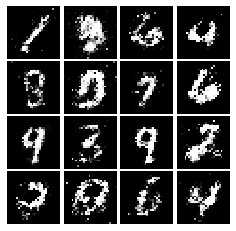

Epoch: 8, Iter: 4020, D: 0.2444, G:0.1606


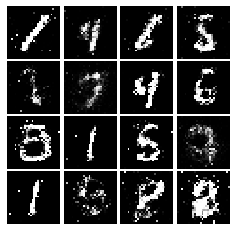

Epoch: 8, Iter: 4040, D: 0.23, G:0.1503


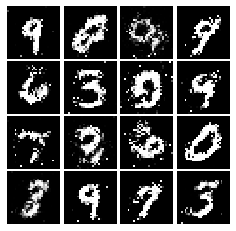

Epoch: 8, Iter: 4060, D: 0.2321, G:0.1802


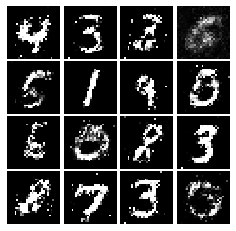

Epoch: 8, Iter: 4080, D: 0.2388, G:0.156


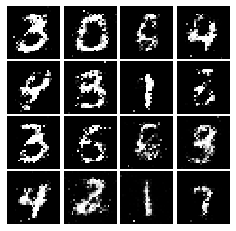

Epoch: 8, Iter: 4100, D: 0.2301, G:0.1577


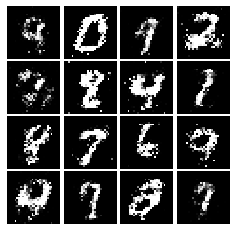

Epoch: 8, Iter: 4120, D: 0.2382, G:0.1552


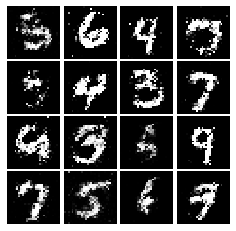

Epoch: 8, Iter: 4140, D: 0.2359, G:0.1575


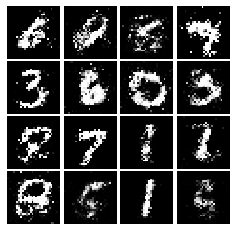

Epoch: 8, Iter: 4160, D: 0.2308, G:0.1614


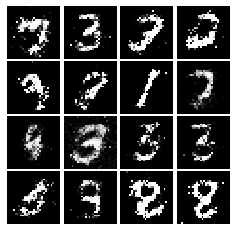

Epoch: 8, Iter: 4180, D: 0.2421, G:0.1863


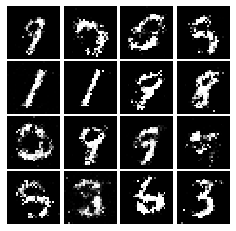

Epoch: 8, Iter: 4200, D: 0.2371, G:0.1548


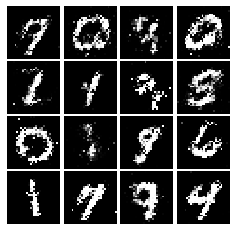

Epoch: 8, Iter: 4220, D: 0.2262, G:0.1663


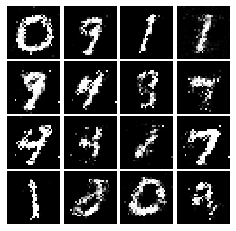

Epoch: 9, Iter: 4240, D: 0.2502, G:0.1462


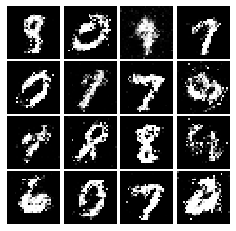

Epoch: 9, Iter: 4260, D: 0.2414, G:0.1578


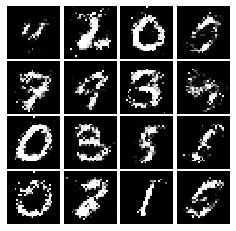

Epoch: 9, Iter: 4280, D: 0.2519, G:0.1866


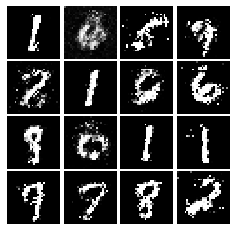

Epoch: 9, Iter: 4300, D: 0.2517, G:0.142


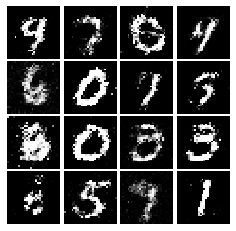

Epoch: 9, Iter: 4320, D: 0.2414, G:0.1581


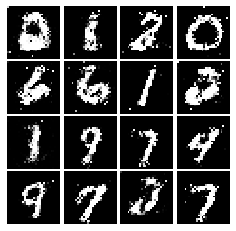

Epoch: 9, Iter: 4340, D: 0.2375, G:0.1592


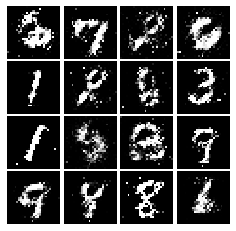

Epoch: 9, Iter: 4360, D: 0.2279, G:0.1364


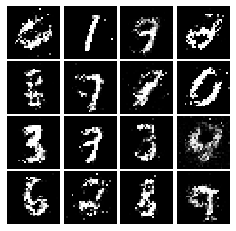

Epoch: 9, Iter: 4380, D: 0.2586, G:0.2193


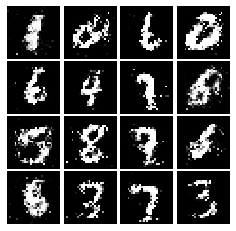

Epoch: 9, Iter: 4400, D: 0.225, G:0.1813


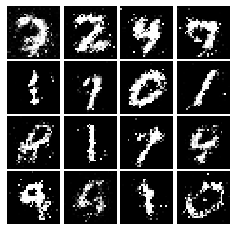

Epoch: 9, Iter: 4420, D: 0.2122, G:0.159


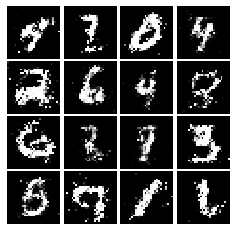

Epoch: 9, Iter: 4440, D: 0.2372, G:0.1645


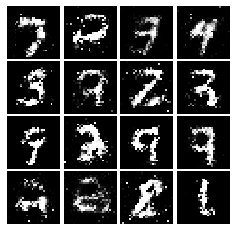

Epoch: 9, Iter: 4460, D: 0.2322, G:0.1637


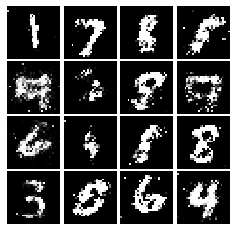

Epoch: 9, Iter: 4480, D: 0.2292, G:0.1747


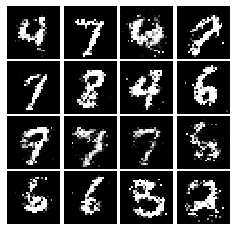

Epoch: 9, Iter: 4500, D: 0.2389, G:0.1627


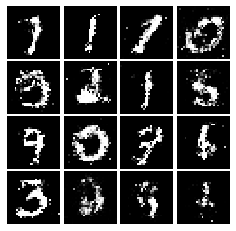

Epoch: 9, Iter: 4520, D: 0.2341, G:0.1466


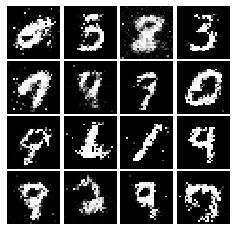

Epoch: 9, Iter: 4540, D: 0.2307, G:0.1539


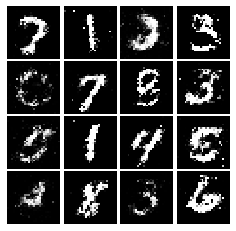

Epoch: 9, Iter: 4560, D: 0.2329, G:0.1578


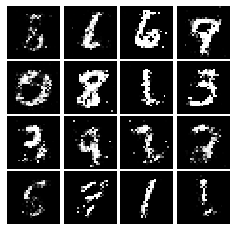

Epoch: 9, Iter: 4580, D: 0.2395, G:0.1674


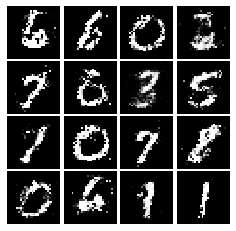

Epoch: 9, Iter: 4600, D: 0.2432, G:0.1613


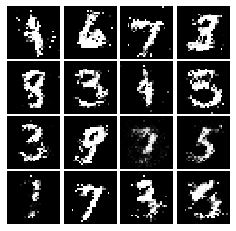

Epoch: 9, Iter: 4620, D: 0.2423, G:0.1464


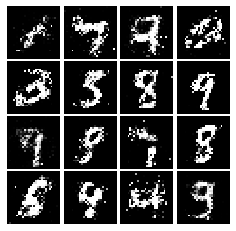

Epoch: 9, Iter: 4640, D: 0.2357, G:0.1671


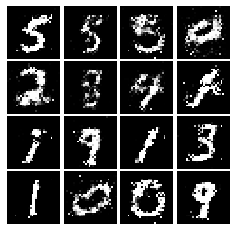

Epoch: 9, Iter: 4660, D: 0.2282, G:0.1632


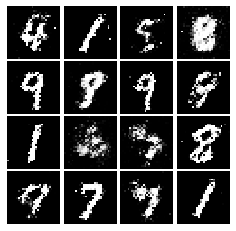

Epoch: 9, Iter: 4680, D: 0.2378, G:0.1663


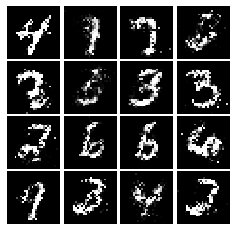

Final images


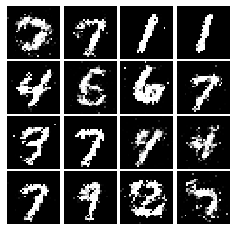

In [45]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [46]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28,28,1),input_shape=(784,)),
        tf.keras.layers.Conv2D(32,(5,5),strides=1,padding='VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides=2),
        tf.keras.layers.Conv2D(64,(5,5),strides=1,padding='VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
    

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [48]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.Dense(4*4*64,input_shape=(noise_dim,),activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(64,(4,4),strides = 2,activation = 'relu',padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1,(4,4),strides = 2,activation = 'tanh',padding = 'SAME'),])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.346, G:0.6609


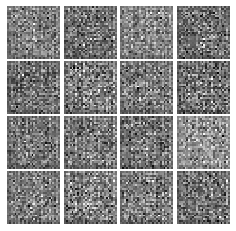

Epoch: 0, Iter: 20, D: 0.3904, G:1.538


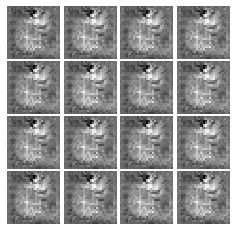

Epoch: 0, Iter: 40, D: 0.009817, G:4.792


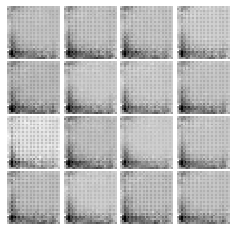

Epoch: 0, Iter: 60, D: 0.002148, G:6.208


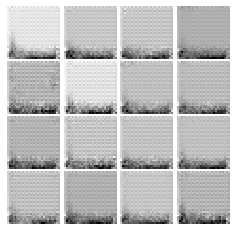

Epoch: 0, Iter: 80, D: 0.001319, G:7.085


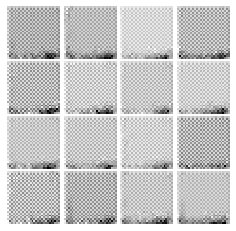

Epoch: 0, Iter: 100, D: 0.0004585, G:7.717


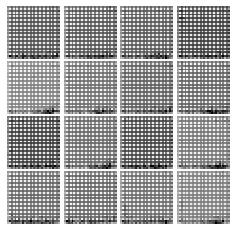

Epoch: 0, Iter: 120, D: 0.000294, G:8.155


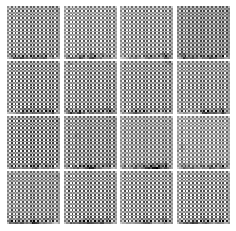

Epoch: 0, Iter: 140, D: 0.0002082, G:8.497


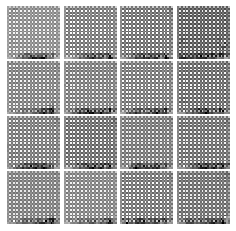

Epoch: 0, Iter: 160, D: 0.0001633, G:8.76


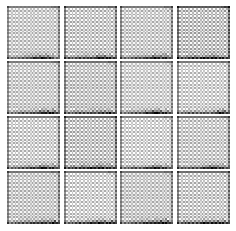

Epoch: 0, Iter: 180, D: 0.0001326, G:8.985


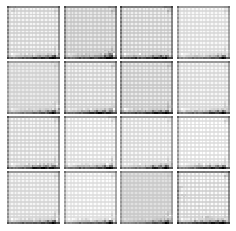

Epoch: 0, Iter: 200, D: 0.0002297, G:8.395


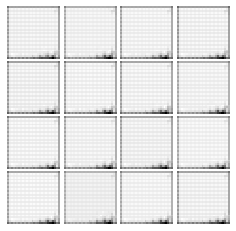

Epoch: 0, Iter: 220, D: 9.532e-05, G:9.316


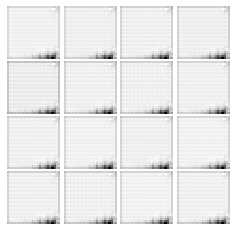

Epoch: 0, Iter: 240, D: 4.633e-05, G:10.02


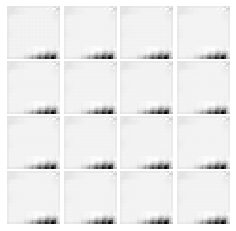

Epoch: 0, Iter: 260, D: 0.0008979, G:8.297


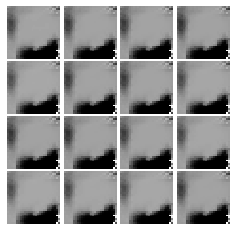

Epoch: 0, Iter: 280, D: 5.752, G:2.503


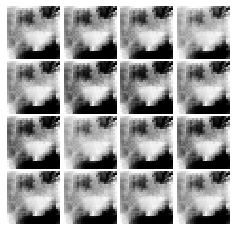

Epoch: 0, Iter: 300, D: 0.3531, G:2.654


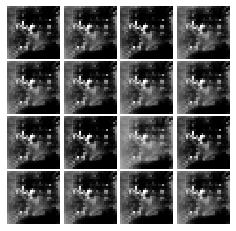

Epoch: 0, Iter: 320, D: 0.1474, G:2.952


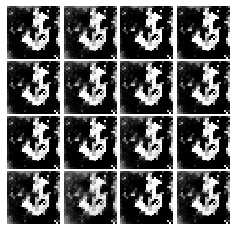

Epoch: 0, Iter: 340, D: 0.0791, G:4.021


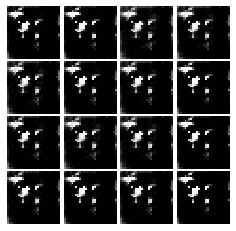

Epoch: 0, Iter: 360, D: 3.18, G:11.51


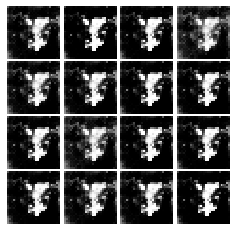

Epoch: 0, Iter: 380, D: 0.5027, G:8.266


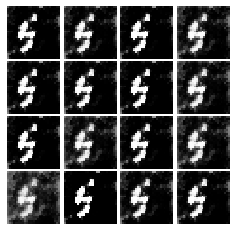

Epoch: 0, Iter: 400, D: 0.2044, G:3.758


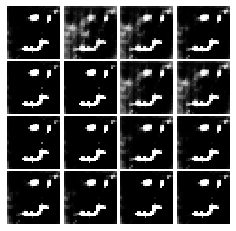

Epoch: 0, Iter: 420, D: 1.238, G:1.854


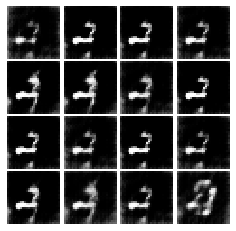

Epoch: 0, Iter: 440, D: 1.065, G:2.135


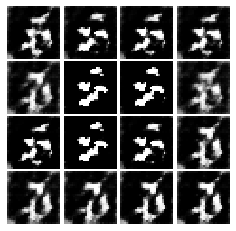

Epoch: 0, Iter: 460, D: 0.8664, G:3.004


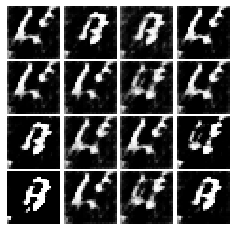

Epoch: 1, Iter: 480, D: 1.106, G:1.183


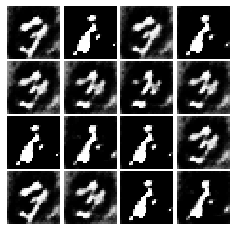

Epoch: 1, Iter: 500, D: 0.5891, G:2.362


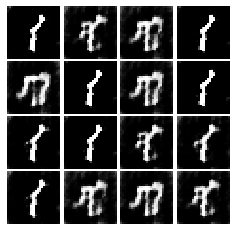

Epoch: 1, Iter: 520, D: 1.272, G:1.729


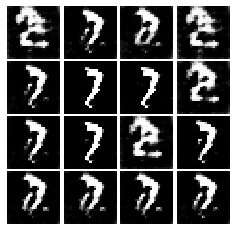

Epoch: 1, Iter: 540, D: 0.5433, G:2.975


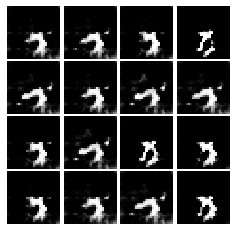

Epoch: 1, Iter: 560, D: 1.618, G:1.556


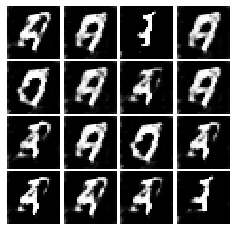

Epoch: 1, Iter: 580, D: 0.6569, G:1.939


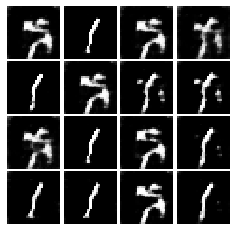

Epoch: 1, Iter: 600, D: 1.036, G:2.846


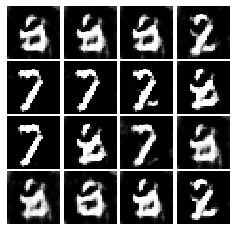

Epoch: 1, Iter: 620, D: 0.4517, G:3.309


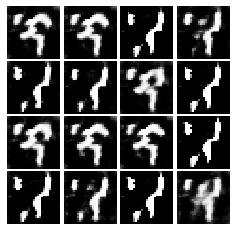

Epoch: 1, Iter: 640, D: 0.1676, G:3.087


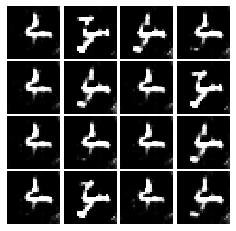

Epoch: 1, Iter: 660, D: 0.6505, G:1.759


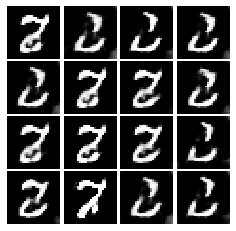

Epoch: 1, Iter: 680, D: 0.6737, G:2.029


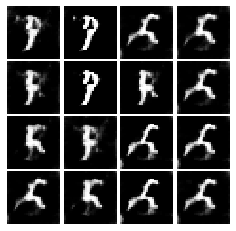

Epoch: 1, Iter: 700, D: 0.6409, G:2.148


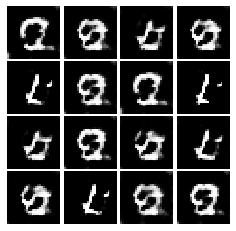

Epoch: 1, Iter: 720, D: 0.6227, G:2.539


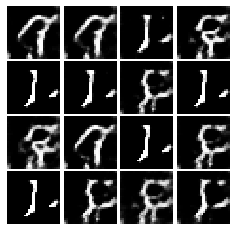

Epoch: 1, Iter: 740, D: 0.7265, G:1.593


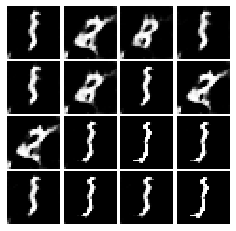

Epoch: 1, Iter: 760, D: 0.4627, G:2.281


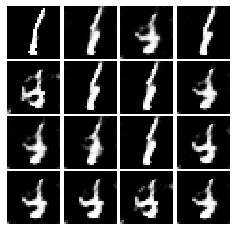

Epoch: 1, Iter: 780, D: 0.3989, G:1.759


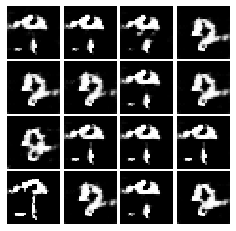

Epoch: 1, Iter: 800, D: 0.1381, G:4.286


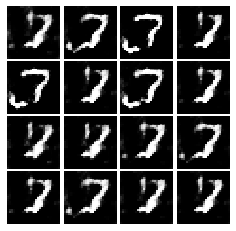

Epoch: 1, Iter: 820, D: 0.2634, G:3.238


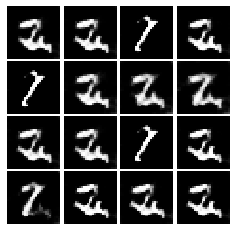

Epoch: 1, Iter: 840, D: 1.272, G:1.039


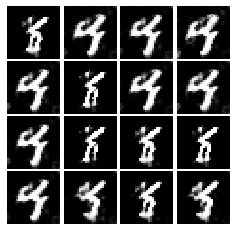

Epoch: 1, Iter: 860, D: 0.4522, G:2.367


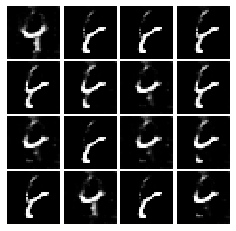

Epoch: 1, Iter: 880, D: 0.5108, G:2.569


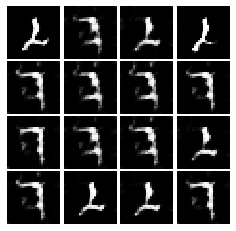

Epoch: 1, Iter: 900, D: 0.3778, G:3.443


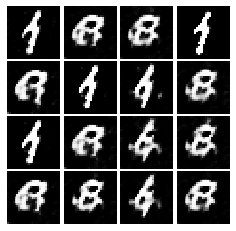

Epoch: 1, Iter: 920, D: 0.275, G:2.491


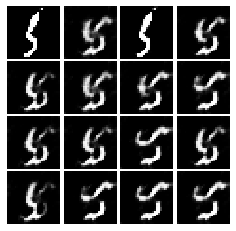

Epoch: 2, Iter: 940, D: 0.3788, G:3.129


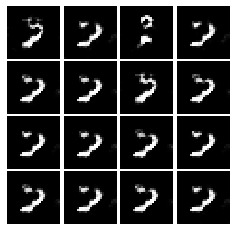

Epoch: 2, Iter: 960, D: 0.323, G:2.986


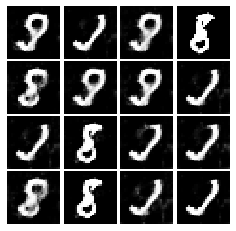

Epoch: 2, Iter: 980, D: 0.7807, G:3.201


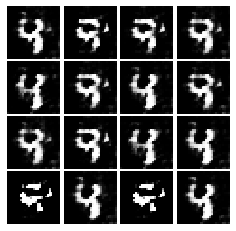

Epoch: 2, Iter: 1000, D: 0.1436, G:3.271


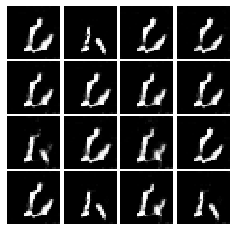

Epoch: 2, Iter: 1020, D: 0.2912, G:5.115


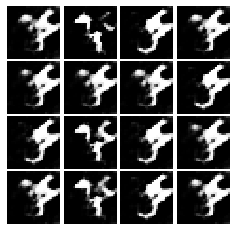

Epoch: 2, Iter: 1040, D: 0.4941, G:3.892


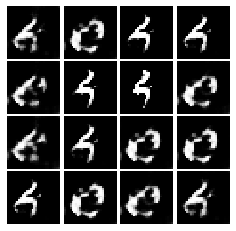

Epoch: 2, Iter: 1060, D: 0.5559, G:2.978


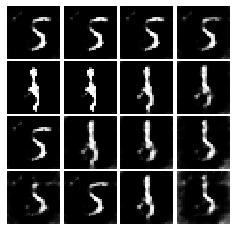

Epoch: 2, Iter: 1080, D: 0.5872, G:2.272


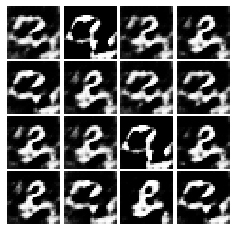

Epoch: 2, Iter: 1100, D: 0.521, G:2.513


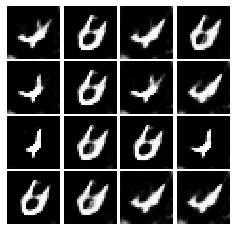

Epoch: 2, Iter: 1120, D: 0.974, G:3.009


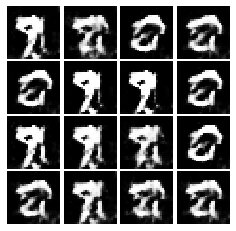

Epoch: 2, Iter: 1140, D: 0.5673, G:3.676


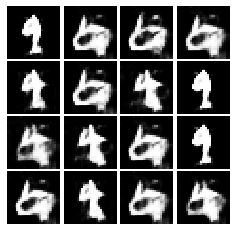

Epoch: 2, Iter: 1160, D: 0.2601, G:3.043


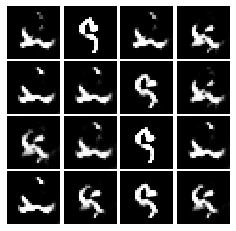

Epoch: 2, Iter: 1180, D: 0.4033, G:1.761


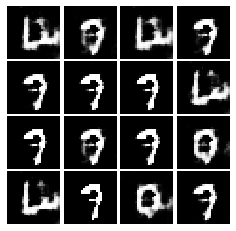

Epoch: 2, Iter: 1200, D: 0.3314, G:4.444


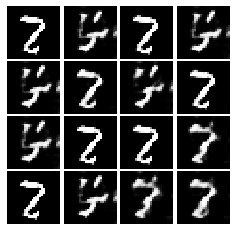

Epoch: 2, Iter: 1220, D: 1.987, G:2.494


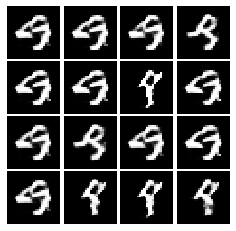

Epoch: 2, Iter: 1240, D: 0.3877, G:2.924


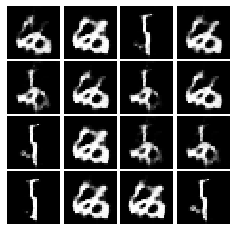

Epoch: 2, Iter: 1260, D: 0.4025, G:3.506


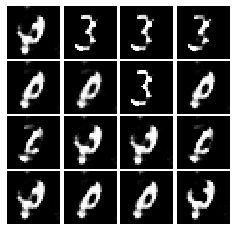

Epoch: 2, Iter: 1280, D: 0.3249, G:3.412


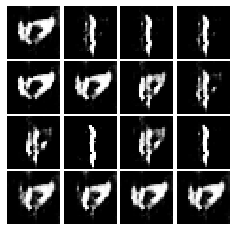

Epoch: 2, Iter: 1300, D: 0.392, G:2.734


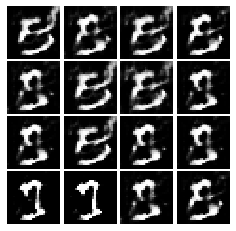

Epoch: 2, Iter: 1320, D: 0.5027, G:3.066


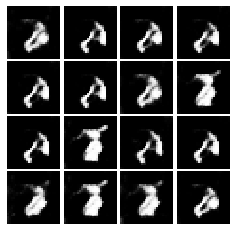

Epoch: 2, Iter: 1340, D: 0.4345, G:4.18


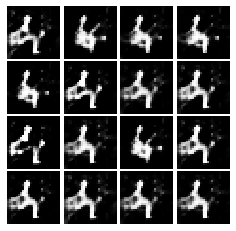

Epoch: 2, Iter: 1360, D: 0.7419, G:2.447


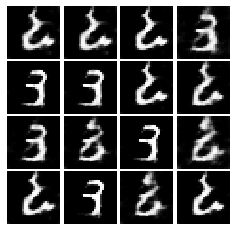

Epoch: 2, Iter: 1380, D: 0.3655, G:4.568


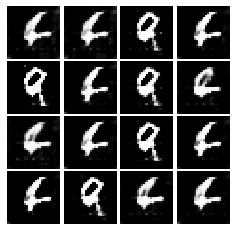

Epoch: 2, Iter: 1400, D: 0.4063, G:3.315


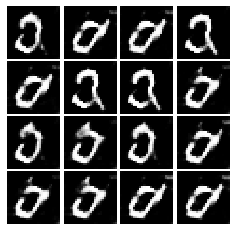

Epoch: 3, Iter: 1420, D: 0.4355, G:3.186


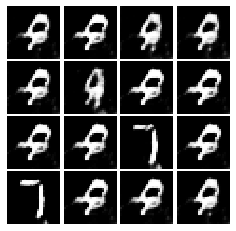

Epoch: 3, Iter: 1440, D: 0.3303, G:3.225


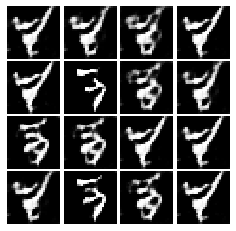

Epoch: 3, Iter: 1460, D: 0.8661, G:3.788


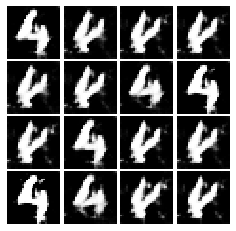

Epoch: 3, Iter: 1480, D: 0.8546, G:2.187


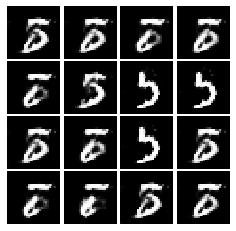

Epoch: 3, Iter: 1500, D: 0.9087, G:2.057


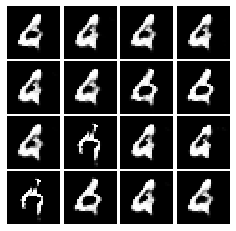

Epoch: 3, Iter: 1520, D: 0.9347, G:3.356


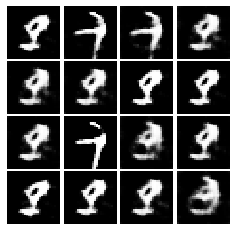

Epoch: 3, Iter: 1540, D: 0.8253, G:5.618


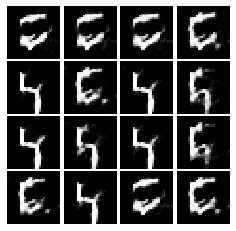

Epoch: 3, Iter: 1560, D: 0.2004, G:2.876


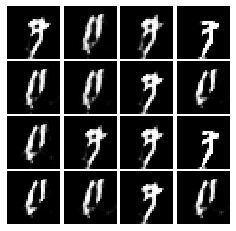

Epoch: 3, Iter: 1580, D: 0.7476, G:2.432


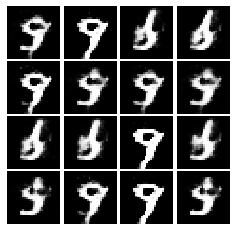

Epoch: 3, Iter: 1600, D: 0.3046, G:2.79


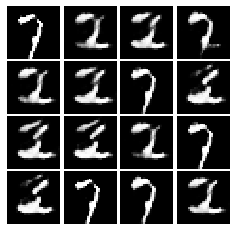

Epoch: 3, Iter: 1620, D: 0.2789, G:3.172


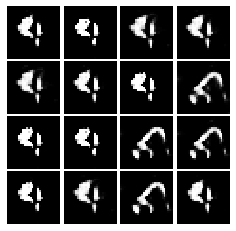

Epoch: 3, Iter: 1640, D: 0.4802, G:2.709


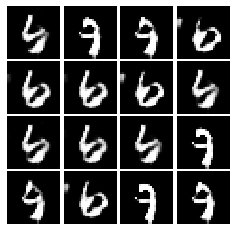

Epoch: 3, Iter: 1660, D: 0.2748, G:5.352


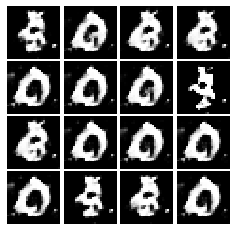

Epoch: 3, Iter: 1680, D: 0.1794, G:4.46


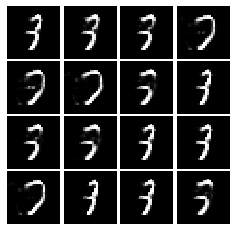

Epoch: 3, Iter: 1700, D: 0.4834, G:4.777


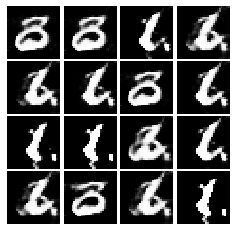

Epoch: 3, Iter: 1720, D: 0.1782, G:5.29


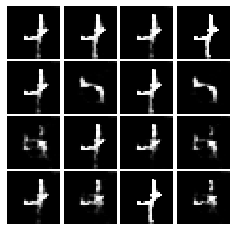

Epoch: 3, Iter: 1740, D: 0.8274, G:11.12


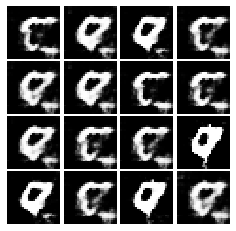

Epoch: 3, Iter: 1760, D: 0.3698, G:3.16


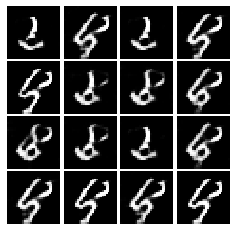

Epoch: 3, Iter: 1780, D: 0.3881, G:3.372


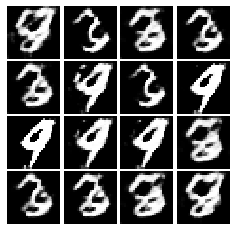

Epoch: 3, Iter: 1800, D: 0.3748, G:3.207


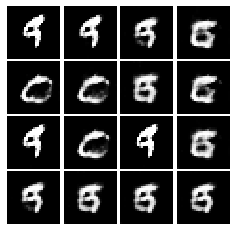

Epoch: 3, Iter: 1820, D: 0.6165, G:6.711


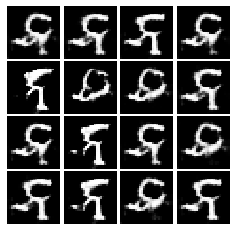

Epoch: 3, Iter: 1840, D: 0.2746, G:2.627


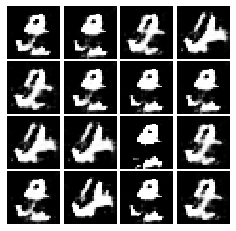

Epoch: 3, Iter: 1860, D: 0.3696, G:5.56


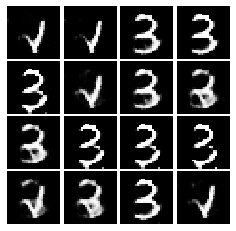

Epoch: 4, Iter: 1880, D: 0.9132, G:5.02


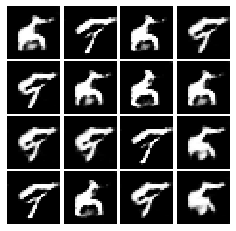

Epoch: 4, Iter: 1900, D: 0.1412, G:4.207


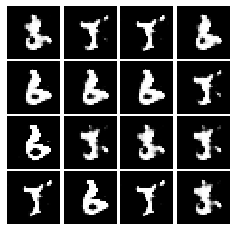

Epoch: 4, Iter: 1920, D: 0.4601, G:6.006


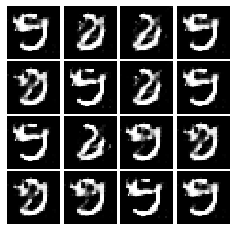

Epoch: 4, Iter: 1940, D: 0.7015, G:2.399


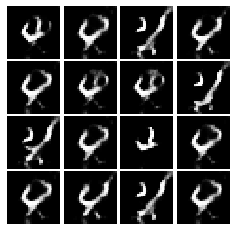

Epoch: 4, Iter: 1960, D: 0.2492, G:3.952


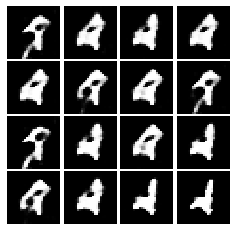

Epoch: 4, Iter: 1980, D: 0.4336, G:3.211


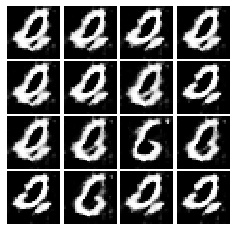

Epoch: 4, Iter: 2000, D: 0.8569, G:1.777


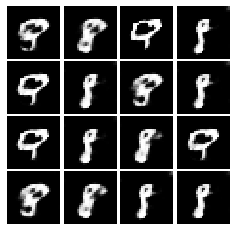

Epoch: 4, Iter: 2020, D: 0.6206, G:4.645


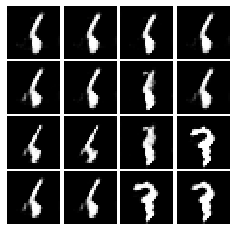

Epoch: 4, Iter: 2040, D: 0.2093, G:3.751


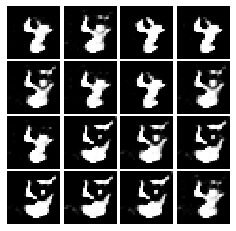

Epoch: 4, Iter: 2060, D: 0.3596, G:3.625


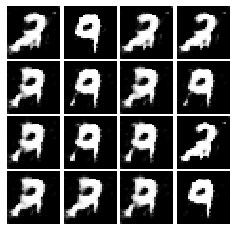

Epoch: 4, Iter: 2080, D: 0.3278, G:4.161


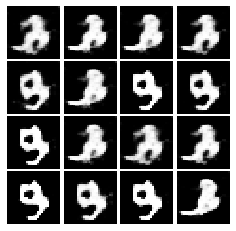

Epoch: 4, Iter: 2100, D: 0.226, G:3.522


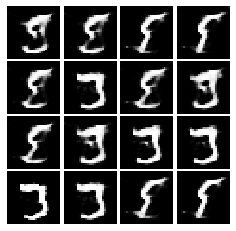

Epoch: 4, Iter: 2120, D: 0.6711, G:2.585


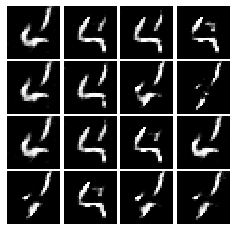

Epoch: 4, Iter: 2140, D: 0.8685, G:5.053


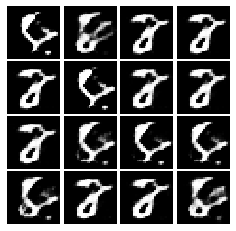

Epoch: 4, Iter: 2160, D: 0.6078, G:4.138


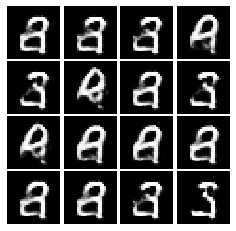

Epoch: 4, Iter: 2180, D: 0.4153, G:3.775


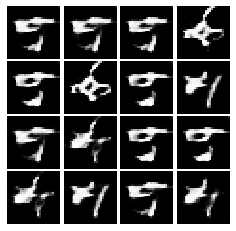

Epoch: 4, Iter: 2200, D: 1.13, G:4.853


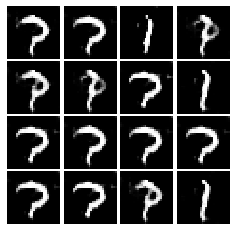

Epoch: 4, Iter: 2220, D: 0.0955, G:4.235


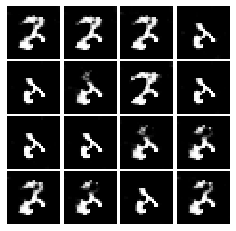

Epoch: 4, Iter: 2240, D: 0.3819, G:1.788


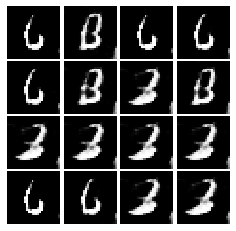

Epoch: 4, Iter: 2260, D: 0.9385, G:3.892


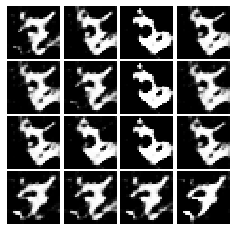

Epoch: 4, Iter: 2280, D: 0.3589, G:4.799


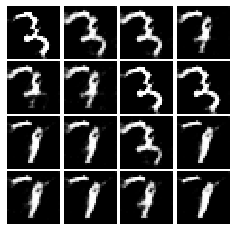

Epoch: 4, Iter: 2300, D: 0.1993, G:3.408


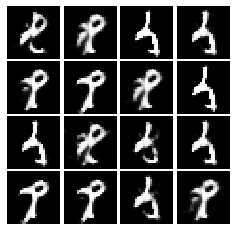

Epoch: 4, Iter: 2320, D: 0.257, G:2.802


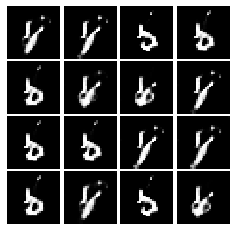

Epoch: 4, Iter: 2340, D: 0.3153, G:3.922


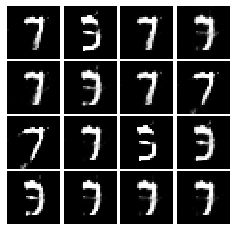

Final images


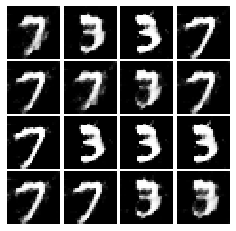

In [49]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
